# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.96

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9606, 0.9463030435144901)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: xsrives3
Name: super-eon-130
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/xsrives3
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120420-xsrives3/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2578,3287,9378
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2578,2528,1671,3439,1633,3394
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4452,10791
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 627,822,2361
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 627,674,437,851,416,805
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1132,2678
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:22<3:47:45, 22.81s/it]

Epoch 1/600:   0%|▎                                                                                                                                                            | 1/600 [00:22<3:47:45, 22.81s/it, v_num=s3_1, total_loss_train=319, kl_local_train=34.6]

Epoch 2/600:   0%|▎                                                                                                                                                            | 1/600 [00:22<3:47:45, 22.81s/it, v_num=s3_1, total_loss_train=319, kl_local_train=34.6]

Epoch 2/600:   0%|▌                                                                                                                                                            | 2/600 [00:36<2:56:19, 17.69s/it, v_num=s3_1, total_loss_train=319, kl_local_train=34.6]

Epoch 2/600:   0%|▌                                                                                                                                                            | 2/600 [00:36<2:56:19, 17.69s/it, v_num=s3_1, total_loss_train=157, kl_local_train=51.3]

Epoch 3/600:   0%|▌                                                                                                                                                            | 2/600 [00:36<2:56:19, 17.69s/it, v_num=s3_1, total_loss_train=157, kl_local_train=51.3]

Epoch 3/600:   0%|▊                                                                                                                                                            | 3/600 [00:51<2:41:52, 16.27s/it, v_num=s3_1, total_loss_train=157, kl_local_train=51.3]

Epoch 3/600:   0%|▊                                                                                                                                                            | 3/600 [00:51<2:41:52, 16.27s/it, v_num=s3_1, total_loss_train=141, kl_local_train=49.2]

Epoch 4/600:   0%|▊                                                                                                                                                            | 3/600 [00:51<2:41:52, 16.27s/it, v_num=s3_1, total_loss_train=141, kl_local_train=49.2]

Epoch 4/600:   1%|█                                                                                                                                                            | 4/600 [01:07<2:41:25, 16.25s/it, v_num=s3_1, total_loss_train=141, kl_local_train=49.2]

Epoch 4/600:   1%|█                                                                                                                                                            | 4/600 [01:07<2:41:25, 16.25s/it, v_num=s3_1, total_loss_train=138, kl_local_train=42.3]

Epoch 5/600:   1%|█                                                                                                                                                            | 4/600 [01:07<2:41:25, 16.25s/it, v_num=s3_1, total_loss_train=138, kl_local_train=42.3]

Epoch 5/600:   1%|█▎                                                                                                                                                           | 5/600 [01:22<2:36:53, 15.82s/it, v_num=s3_1, total_loss_train=138, kl_local_train=42.3]

Epoch 5/600:   1%|█▎                                                                                                                                                           | 5/600 [01:22<2:36:53, 15.82s/it, v_num=s3_1, total_loss_train=136, kl_local_train=33.7]

Epoch 6/600:   1%|█▎                                                                                                                                                           | 5/600 [01:24<2:36:53, 15.82s/it, v_num=s3_1, total_loss_train=136, kl_local_train=33.7]

Epoch 6/600:   1%|█▌                                                                                                                                                           | 6/600 [01:38<2:37:20, 15.89s/it, v_num=s3_1, total_loss_train=136, kl_local_train=33.7]

Epoch 6/600:   1%|▎                        | 6/600 [01:38<2:37:20, 15.89s/it, v_num=s3_1, total_loss_train=136, kl_local_train=25.1, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 7/600:   1%|▎                        | 6/600 [01:38<2:37:20, 15.89s/it, v_num=s3_1, total_loss_train=136, kl_local_train=25.1, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 7/600:   1%|▎                        | 7/600 [01:53<2:32:57, 15.48s/it, v_num=s3_1, total_loss_train=136, kl_local_train=25.1, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 7/600:   1%|▎                        | 7/600 [01:53<2:32:57, 15.48s/it, v_num=s3_1, total_loss_train=135, kl_local_train=18.1, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 8/600:   1%|▎                        | 7/600 [01:53<2:32:57, 15.48s/it, v_num=s3_1, total_loss_train=135, kl_local_train=18.1, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 8/600:   1%|▎                        | 8/600 [02:07<2:28:59, 15.10s/it, v_num=s3_1, total_loss_train=135, kl_local_train=18.1, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 8/600:   1%|▎                        | 8/600 [02:07<2:28:59, 15.10s/it, v_num=s3_1, total_loss_train=143, kl_local_train=12.4, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 9/600:   1%|▎                        | 8/600 [02:07<2:28:59, 15.10s/it, v_num=s3_1, total_loss_train=143, kl_local_train=12.4, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 9/600:   2%|▍                        | 9/600 [02:22<2:26:34, 14.88s/it, v_num=s3_1, total_loss_train=143, kl_local_train=12.4, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 9/600:   2%|▍                        | 9/600 [02:22<2:26:34, 14.88s/it, v_num=s3_1, total_loss_train=150, kl_local_train=11.5, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 10/600:   2%|▎                       | 9/600 [02:22<2:26:34, 14.88s/it, v_num=s3_1, total_loss_train=150, kl_local_train=11.5, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 10/600:   2%|▍                      | 10/600 [02:37<2:26:27, 14.89s/it, v_num=s3_1, total_loss_train=150, kl_local_train=11.5, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 10/600:   2%|▍                      | 10/600 [02:37<2:26:27, 14.89s/it, v_num=s3_1, total_loss_train=158, kl_local_train=13.3, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 11/600:   2%|▍                      | 10/600 [02:38<2:26:27, 14.89s/it, v_num=s3_1, total_loss_train=158, kl_local_train=13.3, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 11/600:   2%|▍                      | 11/600 [02:53<2:29:33, 15.24s/it, v_num=s3_1, total_loss_train=158, kl_local_train=13.3, metric_mi|status_control_train=0.0187, metric_mi|zone_train=0.00723, metric_mi|time_cat_train=0.0123, metric_mi|mouse_train=0.0349]

Epoch 11/600:   2%|▍                      | 11/600 [02:53<2:29:33, 15.24s/it, v_num=s3_1, total_loss_train=165, kl_local_train=30.7, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 12/600:   2%|▍                      | 11/600 [02:53<2:29:33, 15.24s/it, v_num=s3_1, total_loss_train=165, kl_local_train=30.7, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 12/600:   2%|▍                      | 12/600 [03:08<2:30:00, 15.31s/it, v_num=s3_1, total_loss_train=165, kl_local_train=30.7, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 12/600:   2%|▍                      | 12/600 [03:08<2:30:00, 15.31s/it, v_num=s3_1, total_loss_train=168, kl_local_train=87.8, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 13/600:   2%|▍                      | 12/600 [03:08<2:30:00, 15.31s/it, v_num=s3_1, total_loss_train=168, kl_local_train=87.8, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 13/600:   2%|▍                      | 13/600 [03:22<2:26:34, 14.98s/it, v_num=s3_1, total_loss_train=168, kl_local_train=87.8, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 13/600:   2%|▌                       | 13/600 [03:22<2:26:34, 14.98s/it, v_num=s3_1, total_loss_train=168, kl_local_train=107, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 14/600:   2%|▌                       | 13/600 [03:22<2:26:34, 14.98s/it, v_num=s3_1, total_loss_train=168, kl_local_train=107, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 14/600:   2%|▌                       | 14/600 [03:37<2:24:52, 14.83s/it, v_num=s3_1, total_loss_train=168, kl_local_train=107, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 14/600:   2%|▌                       | 14/600 [03:37<2:24:52, 14.83s/it, v_num=s3_1, total_loss_train=172, kl_local_train=101, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 15/600:   2%|▌                       | 14/600 [03:37<2:24:52, 14.83s/it, v_num=s3_1, total_loss_train=172, kl_local_train=101, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 15/600:   2%|▌                       | 15/600 [03:51<2:24:07, 14.78s/it, v_num=s3_1, total_loss_train=172, kl_local_train=101, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 15/600:   2%|▋                        | 15/600 [03:51<2:24:07, 14.78s/it, v_num=s3_1, total_loss_train=176, kl_local_train=98, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 16/600:   2%|▋                        | 15/600 [03:53<2:24:07, 14.78s/it, v_num=s3_1, total_loss_train=176, kl_local_train=98, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 16/600:   3%|▋                        | 16/600 [04:07<2:27:23, 15.14s/it, v_num=s3_1, total_loss_train=176, kl_local_train=98, metric_mi|status_control_train=0.0201, metric_mi|zone_train=0.00782, metric_mi|time_cat_train=0.0134, metric_mi|mouse_train=0.0358]

Epoch 16/600:   3%|▊                             | 16/600 [04:07<2:27:23, 15.14s/it, v_num=s3_1, total_loss_train=179, kl_local_train=107, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 17/600:   3%|▊                             | 16/600 [04:07<2:27:23, 15.14s/it, v_num=s3_1, total_loss_train=179, kl_local_train=107, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 17/600:   3%|▊                             | 17/600 [04:22<2:25:54, 15.02s/it, v_num=s3_1, total_loss_train=179, kl_local_train=107, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 17/600:   3%|▊                             | 17/600 [04:22<2:25:54, 15.02s/it, v_num=s3_1, total_loss_train=183, kl_local_train=124, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 18/600:   3%|▊                             | 17/600 [04:22<2:25:54, 15.02s/it, v_num=s3_1, total_loss_train=183, kl_local_train=124, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 18/600:   3%|▉                             | 18/600 [04:37<2:23:57, 14.84s/it, v_num=s3_1, total_loss_train=183, kl_local_train=124, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 18/600:   3%|▉                             | 18/600 [04:37<2:23:57, 14.84s/it, v_num=s3_1, total_loss_train=186, kl_local_train=134, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 19/600:   3%|▉                             | 18/600 [04:37<2:23:57, 14.84s/it, v_num=s3_1, total_loss_train=186, kl_local_train=134, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 19/600:   3%|▉                             | 19/600 [04:51<2:22:43, 14.74s/it, v_num=s3_1, total_loss_train=186, kl_local_train=134, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 19/600:   3%|▉                             | 19/600 [04:51<2:22:43, 14.74s/it, v_num=s3_1, total_loss_train=190, kl_local_train=137, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 20/600:   3%|▉                             | 19/600 [04:51<2:22:43, 14.74s/it, v_num=s3_1, total_loss_train=190, kl_local_train=137, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 20/600:   3%|█                             | 20/600 [05:06<2:22:16, 14.72s/it, v_num=s3_1, total_loss_train=190, kl_local_train=137, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 20/600:   3%|█                             | 20/600 [05:06<2:22:16, 14.72s/it, v_num=s3_1, total_loss_train=194, kl_local_train=139, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 21/600:   3%|█                             | 20/600 [05:07<2:22:16, 14.72s/it, v_num=s3_1, total_loss_train=194, kl_local_train=139, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 21/600:   4%|█                             | 21/600 [05:22<2:25:18, 15.06s/it, v_num=s3_1, total_loss_train=194, kl_local_train=139, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0887]

Epoch 21/600:   4%|█                            | 21/600 [05:22<2:25:18, 15.06s/it, v_num=s3_1, total_loss_train=198, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 22/600:   4%|█                            | 21/600 [05:22<2:25:18, 15.06s/it, v_num=s3_1, total_loss_train=198, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 22/600:   4%|█                            | 22/600 [05:36<2:22:43, 14.82s/it, v_num=s3_1, total_loss_train=198, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 22/600:   4%|█                            | 22/600 [05:36<2:22:43, 14.82s/it, v_num=s3_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 23/600:   4%|█                            | 22/600 [05:36<2:22:43, 14.82s/it, v_num=s3_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 23/600:   4%|█                            | 23/600 [05:50<2:20:24, 14.60s/it, v_num=s3_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 23/600:   4%|█                            | 23/600 [05:50<2:20:24, 14.60s/it, v_num=s3_1, total_loss_train=206, kl_local_train=154, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 24/600:   4%|█                            | 23/600 [05:50<2:20:24, 14.60s/it, v_num=s3_1, total_loss_train=206, kl_local_train=154, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 24/600:   4%|█▏                           | 24/600 [06:03<2:17:12, 14.29s/it, v_num=s3_1, total_loss_train=206, kl_local_train=154, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 24/600:   4%|█▏                           | 24/600 [06:03<2:17:12, 14.29s/it, v_num=s3_1, total_loss_train=210, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 25/600:   4%|█▏                           | 24/600 [06:04<2:17:12, 14.29s/it, v_num=s3_1, total_loss_train=210, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 25/600:   4%|█▏                           | 25/600 [06:18<2:16:54, 14.29s/it, v_num=s3_1, total_loss_train=210, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 25/600:   4%|█▏                           | 25/600 [06:18<2:16:54, 14.29s/it, v_num=s3_1, total_loss_train=214, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 26/600:   4%|█▏                           | 25/600 [06:19<2:16:54, 14.29s/it, v_num=s3_1, total_loss_train=214, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 26/600:   4%|█▎                           | 26/600 [06:33<2:19:49, 14.62s/it, v_num=s3_1, total_loss_train=214, kl_local_train=153, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 26/600:   4%|█▎                            | 26/600 [06:33<2:19:49, 14.62s/it, v_num=s3_1, total_loss_train=218, kl_local_train=154, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                            | 26/600 [06:33<2:19:49, 14.62s/it, v_num=s3_1, total_loss_train=218, kl_local_train=154, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                            | 27/600 [06:47<2:18:18, 14.48s/it, v_num=s3_1, total_loss_train=218, kl_local_train=154, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                            | 27/600 [06:47<2:18:18, 14.48s/it, v_num=s3_1, total_loss_train=222, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 28/600:   4%|█▎                            | 27/600 [06:47<2:18:18, 14.48s/it, v_num=s3_1, total_loss_train=222, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▍                            | 28/600 [07:01<2:16:49, 14.35s/it, v_num=s3_1, total_loss_train=222, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▍                            | 28/600 [07:01<2:16:49, 14.35s/it, v_num=s3_1, total_loss_train=227, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                            | 28/600 [07:01<2:16:49, 14.35s/it, v_num=s3_1, total_loss_train=227, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                            | 29/600 [07:16<2:16:11, 14.31s/it, v_num=s3_1, total_loss_train=227, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                            | 29/600 [07:16<2:16:11, 14.31s/it, v_num=s3_1, total_loss_train=231, kl_local_train=161, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                            | 29/600 [07:16<2:16:11, 14.31s/it, v_num=s3_1, total_loss_train=231, kl_local_train=161, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▌                            | 30/600 [07:31<2:18:11, 14.55s/it, v_num=s3_1, total_loss_train=231, kl_local_train=161, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▌                            | 30/600 [07:31<2:18:11, 14.55s/it, v_num=s3_1, total_loss_train=235, kl_local_train=156, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▌                            | 30/600 [07:32<2:18:11, 14.55s/it, v_num=s3_1, total_loss_train=235, kl_local_train=156, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▌                            | 31/600 [07:46<2:20:36, 14.83s/it, v_num=s3_1, total_loss_train=235, kl_local_train=156, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▋                              | 31/600 [07:46<2:20:36, 14.83s/it, v_num=s3_1, total_loss_train=239, kl_local_train=158, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 32/600:   5%|█▋                              | 31/600 [07:46<2:20:36, 14.83s/it, v_num=s3_1, total_loss_train=239, kl_local_train=158, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 32/600:   5%|█▋                              | 32/600 [08:00<2:17:43, 14.55s/it, v_num=s3_1, total_loss_train=239, kl_local_train=158, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 32/600:   5%|█▋                              | 32/600 [08:00<2:17:43, 14.55s/it, v_num=s3_1, total_loss_train=243, kl_local_train=158, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 33/600:   5%|█▋                              | 32/600 [08:00<2:17:43, 14.55s/it, v_num=s3_1, total_loss_train=243, kl_local_train=158, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 33/600:   6%|█▊                              | 33/600 [08:14<2:15:56, 14.39s/it, v_num=s3_1, total_loss_train=243, kl_local_train=158, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 33/600:   6%|█▊                              | 33/600 [08:14<2:15:56, 14.39s/it, v_num=s3_1, total_loss_train=247, kl_local_train=160, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 34/600:   6%|█▊                              | 33/600 [08:14<2:15:56, 14.39s/it, v_num=s3_1, total_loss_train=247, kl_local_train=160, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 34/600:   6%|█▊                              | 34/600 [08:28<2:15:26, 14.36s/it, v_num=s3_1, total_loss_train=247, kl_local_train=160, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 34/600:   6%|█▊                              | 34/600 [08:28<2:15:26, 14.36s/it, v_num=s3_1, total_loss_train=252, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 35/600:   6%|█▊                              | 34/600 [08:28<2:15:26, 14.36s/it, v_num=s3_1, total_loss_train=252, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 35/600:   6%|█▊                              | 35/600 [08:43<2:16:52, 14.54s/it, v_num=s3_1, total_loss_train=252, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 35/600:   6%|█▊                              | 35/600 [08:43<2:16:52, 14.54s/it, v_num=s3_1, total_loss_train=256, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 36/600:   6%|█▊                              | 35/600 [08:45<2:16:52, 14.54s/it, v_num=s3_1, total_loss_train=256, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 36/600:   6%|█▉                              | 36/600 [08:59<2:19:14, 14.81s/it, v_num=s3_1, total_loss_train=256, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.147]

Epoch 36/600:   6%|█▊                             | 36/600 [08:59<2:19:14, 14.81s/it, v_num=s3_1, total_loss_train=260, kl_local_train=163, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 37/600:   6%|█▊                             | 36/600 [08:59<2:19:14, 14.81s/it, v_num=s3_1, total_loss_train=260, kl_local_train=163, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 37/600:   6%|█▉                             | 37/600 [09:13<2:16:28, 14.54s/it, v_num=s3_1, total_loss_train=260, kl_local_train=163, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 37/600:   6%|█▉                             | 37/600 [09:13<2:16:28, 14.54s/it, v_num=s3_1, total_loss_train=264, kl_local_train=162, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 38/600:   6%|█▉                             | 37/600 [09:13<2:16:28, 14.54s/it, v_num=s3_1, total_loss_train=264, kl_local_train=162, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 38/600:   6%|█▉                             | 38/600 [09:27<2:16:34, 14.58s/it, v_num=s3_1, total_loss_train=264, kl_local_train=162, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 38/600:   6%|█▉                             | 38/600 [09:27<2:16:34, 14.58s/it, v_num=s3_1, total_loss_train=268, kl_local_train=159, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 39/600:   6%|█▉                             | 38/600 [09:27<2:16:34, 14.58s/it, v_num=s3_1, total_loss_train=268, kl_local_train=159, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 39/600:   6%|██                             | 39/600 [09:41<2:14:15, 14.36s/it, v_num=s3_1, total_loss_train=268, kl_local_train=159, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 39/600:   6%|██                             | 39/600 [09:41<2:14:15, 14.36s/it, v_num=s3_1, total_loss_train=272, kl_local_train=158, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 40/600:   6%|██                             | 39/600 [09:41<2:14:15, 14.36s/it, v_num=s3_1, total_loss_train=272, kl_local_train=158, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 40/600:   7%|██                             | 40/600 [09:55<2:13:25, 14.30s/it, v_num=s3_1, total_loss_train=272, kl_local_train=158, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 40/600:   7%|██                             | 40/600 [09:55<2:13:25, 14.30s/it, v_num=s3_1, total_loss_train=277, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 41/600:   7%|██                             | 40/600 [09:57<2:13:25, 14.30s/it, v_num=s3_1, total_loss_train=277, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 41/600:   7%|██                             | 41/600 [10:11<2:17:49, 14.79s/it, v_num=s3_1, total_loss_train=277, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.2, metric_mi|mouse_train=0.148]

Epoch 41/600:   7%|█▉                           | 41/600 [10:11<2:17:49, 14.79s/it, v_num=s3_1, total_loss_train=281, kl_local_train=156, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 42/600:   7%|█▉                           | 41/600 [10:11<2:17:49, 14.79s/it, v_num=s3_1, total_loss_train=281, kl_local_train=156, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 42/600:   7%|██                           | 42/600 [10:26<2:16:30, 14.68s/it, v_num=s3_1, total_loss_train=281, kl_local_train=156, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 42/600:   7%|██                           | 42/600 [10:26<2:16:30, 14.68s/it, v_num=s3_1, total_loss_train=285, kl_local_train=158, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 43/600:   7%|██                           | 42/600 [10:26<2:16:30, 14.68s/it, v_num=s3_1, total_loss_train=285, kl_local_train=158, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 43/600:   7%|██                           | 43/600 [10:40<2:15:44, 14.62s/it, v_num=s3_1, total_loss_train=285, kl_local_train=158, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 43/600:   7%|██                           | 43/600 [10:40<2:15:44, 14.62s/it, v_num=s3_1, total_loss_train=289, kl_local_train=157, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 44/600:   7%|██                           | 43/600 [10:40<2:15:44, 14.62s/it, v_num=s3_1, total_loss_train=289, kl_local_train=157, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 44/600:   7%|██▏                          | 44/600 [10:54<2:14:02, 14.46s/it, v_num=s3_1, total_loss_train=289, kl_local_train=157, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 44/600:   7%|██▏                          | 44/600 [10:54<2:14:02, 14.46s/it, v_num=s3_1, total_loss_train=294, kl_local_train=157, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 45/600:   7%|██▏                          | 44/600 [10:54<2:14:02, 14.46s/it, v_num=s3_1, total_loss_train=294, kl_local_train=157, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 45/600:   8%|██▏                          | 45/600 [11:10<2:15:56, 14.70s/it, v_num=s3_1, total_loss_train=294, kl_local_train=157, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 45/600:   8%|██▏                          | 45/600 [11:10<2:15:56, 14.70s/it, v_num=s3_1, total_loss_train=298, kl_local_train=160, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 46/600:   8%|██▏                          | 45/600 [11:11<2:15:56, 14.70s/it, v_num=s3_1, total_loss_train=298, kl_local_train=160, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 46/600:   8%|██▏                          | 46/600 [11:25<2:18:58, 15.05s/it, v_num=s3_1, total_loss_train=298, kl_local_train=160, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 46/600:   8%|██▎                           | 46/600 [11:25<2:18:58, 15.05s/it, v_num=s3_1, total_loss_train=302, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 47/600:   8%|██▎                           | 46/600 [11:25<2:18:58, 15.05s/it, v_num=s3_1, total_loss_train=302, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 47/600:   8%|██▎                           | 47/600 [11:40<2:16:54, 14.86s/it, v_num=s3_1, total_loss_train=302, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 47/600:   8%|██▎                           | 47/600 [11:40<2:16:54, 14.86s/it, v_num=s3_1, total_loss_train=306, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 48/600:   8%|██▎                           | 47/600 [11:40<2:16:54, 14.86s/it, v_num=s3_1, total_loss_train=306, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 48/600:   8%|██▍                           | 48/600 [11:55<2:16:46, 14.87s/it, v_num=s3_1, total_loss_train=306, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 48/600:   8%|██▍                           | 48/600 [11:55<2:16:46, 14.87s/it, v_num=s3_1, total_loss_train=310, kl_local_train=159, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 49/600:   8%|██▍                           | 48/600 [11:55<2:16:46, 14.87s/it, v_num=s3_1, total_loss_train=310, kl_local_train=159, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 49/600:   8%|██▍                           | 49/600 [12:09<2:13:45, 14.56s/it, v_num=s3_1, total_loss_train=310, kl_local_train=159, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 49/600:   8%|██▍                           | 49/600 [12:09<2:13:45, 14.56s/it, v_num=s3_1, total_loss_train=315, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 50/600:   8%|██▍                           | 49/600 [12:09<2:13:45, 14.56s/it, v_num=s3_1, total_loss_train=315, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 50/600:   8%|██▌                           | 50/600 [12:22<2:11:17, 14.32s/it, v_num=s3_1, total_loss_train=315, kl_local_train=157, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 50/600:   8%|██▌                           | 50/600 [12:22<2:11:17, 14.32s/it, v_num=s3_1, total_loss_train=319, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 51/600:   8%|██▌                           | 50/600 [12:24<2:11:17, 14.32s/it, v_num=s3_1, total_loss_train=319, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 51/600:   8%|██▌                           | 51/600 [12:37<2:12:22, 14.47s/it, v_num=s3_1, total_loss_train=319, kl_local_train=160, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 51/600:   8%|██▍                          | 51/600 [12:37<2:12:22, 14.47s/it, v_num=s3_1, total_loss_train=319, kl_local_train=161, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   8%|██▍                          | 51/600 [12:37<2:12:22, 14.47s/it, v_num=s3_1, total_loss_train=319, kl_local_train=161, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   9%|██▌                          | 52/600 [12:51<2:11:43, 14.42s/it, v_num=s3_1, total_loss_train=319, kl_local_train=161, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   9%|██▌                          | 52/600 [12:51<2:11:43, 14.42s/it, v_num=s3_1, total_loss_train=319, kl_local_train=157, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▌                          | 52/600 [12:51<2:11:43, 14.42s/it, v_num=s3_1, total_loss_train=319, kl_local_train=157, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▌                          | 53/600 [13:06<2:10:41, 14.34s/it, v_num=s3_1, total_loss_train=319, kl_local_train=157, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▌                          | 53/600 [13:06<2:10:41, 14.34s/it, v_num=s3_1, total_loss_train=319, kl_local_train=158, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▌                          | 53/600 [13:06<2:10:41, 14.34s/it, v_num=s3_1, total_loss_train=319, kl_local_train=158, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▌                          | 54/600 [13:20<2:10:09, 14.30s/it, v_num=s3_1, total_loss_train=319, kl_local_train=158, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▌                          | 54/600 [13:20<2:10:09, 14.30s/it, v_num=s3_1, total_loss_train=319, kl_local_train=155, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▌                          | 54/600 [13:20<2:10:09, 14.30s/it, v_num=s3_1, total_loss_train=319, kl_local_train=155, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▋                          | 55/600 [13:35<2:12:43, 14.61s/it, v_num=s3_1, total_loss_train=319, kl_local_train=155, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▋                          | 55/600 [13:35<2:12:43, 14.61s/it, v_num=s3_1, total_loss_train=319, kl_local_train=153, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▋                          | 55/600 [13:37<2:12:43, 14.61s/it, v_num=s3_1, total_loss_train=319, kl_local_train=153, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▋                          | 56/600 [13:51<2:14:51, 14.87s/it, v_num=s3_1, total_loss_train=319, kl_local_train=153, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▋                          | 56/600 [13:51<2:14:51, 14.87s/it, v_num=s3_1, total_loss_train=319, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 57/600:   9%|██▋                          | 56/600 [13:51<2:14:51, 14.87s/it, v_num=s3_1, total_loss_train=319, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 57/600:  10%|██▊                          | 57/600 [14:05<2:11:54, 14.58s/it, v_num=s3_1, total_loss_train=319, kl_local_train=153, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 57/600:  10%|██▊                          | 57/600 [14:05<2:11:54, 14.58s/it, v_num=s3_1, total_loss_train=319, kl_local_train=152, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 58/600:  10%|██▊                          | 57/600 [14:05<2:11:54, 14.58s/it, v_num=s3_1, total_loss_train=319, kl_local_train=152, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 58/600:  10%|██▊                          | 58/600 [14:19<2:10:10, 14.41s/it, v_num=s3_1, total_loss_train=319, kl_local_train=152, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 58/600:  10%|██▊                          | 58/600 [14:19<2:10:10, 14.41s/it, v_num=s3_1, total_loss_train=319, kl_local_train=151, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 59/600:  10%|██▊                          | 58/600 [14:19<2:10:10, 14.41s/it, v_num=s3_1, total_loss_train=319, kl_local_train=151, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 59/600:  10%|██▊                          | 59/600 [14:33<2:08:58, 14.30s/it, v_num=s3_1, total_loss_train=319, kl_local_train=151, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 59/600:  10%|██▊                          | 59/600 [14:33<2:08:58, 14.30s/it, v_num=s3_1, total_loss_train=319, kl_local_train=149, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 60/600:  10%|██▊                          | 59/600 [14:33<2:08:58, 14.30s/it, v_num=s3_1, total_loss_train=319, kl_local_train=149, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 60/600:  10%|██▉                          | 60/600 [14:47<2:09:06, 14.34s/it, v_num=s3_1, total_loss_train=319, kl_local_train=149, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 60/600:  10%|██▉                          | 60/600 [14:47<2:09:06, 14.34s/it, v_num=s3_1, total_loss_train=319, kl_local_train=144, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 61/600:  10%|██▉                          | 60/600 [14:49<2:09:06, 14.34s/it, v_num=s3_1, total_loss_train=319, kl_local_train=144, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 61/600:  10%|██▉                          | 61/600 [15:02<2:11:41, 14.66s/it, v_num=s3_1, total_loss_train=319, kl_local_train=144, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 61/600:  10%|███                           | 61/600 [15:02<2:11:41, 14.66s/it, v_num=s3_1, total_loss_train=319, kl_local_train=143, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 62/600:  10%|███                           | 61/600 [15:02<2:11:41, 14.66s/it, v_num=s3_1, total_loss_train=319, kl_local_train=143, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 62/600:  10%|███                           | 62/600 [15:16<2:09:22, 14.43s/it, v_num=s3_1, total_loss_train=319, kl_local_train=143, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 62/600:  10%|███                           | 62/600 [15:16<2:09:22, 14.43s/it, v_num=s3_1, total_loss_train=319, kl_local_train=141, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 63/600:  10%|███                           | 62/600 [15:16<2:09:22, 14.43s/it, v_num=s3_1, total_loss_train=319, kl_local_train=141, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 63/600:  10%|███▏                          | 63/600 [15:32<2:11:47, 14.73s/it, v_num=s3_1, total_loss_train=319, kl_local_train=141, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 63/600:  10%|███▏                          | 63/600 [15:32<2:11:47, 14.73s/it, v_num=s3_1, total_loss_train=319, kl_local_train=141, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 64/600:  10%|███▏                          | 63/600 [15:32<2:11:47, 14.73s/it, v_num=s3_1, total_loss_train=319, kl_local_train=141, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 64/600:  11%|███▏                          | 64/600 [15:46<2:10:00, 14.55s/it, v_num=s3_1, total_loss_train=319, kl_local_train=141, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 64/600:  11%|███▏                          | 64/600 [15:46<2:10:00, 14.55s/it, v_num=s3_1, total_loss_train=319, kl_local_train=140, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 65/600:  11%|███▏                          | 64/600 [15:46<2:10:00, 14.55s/it, v_num=s3_1, total_loss_train=319, kl_local_train=140, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 65/600:  11%|███▎                          | 65/600 [16:00<2:09:33, 14.53s/it, v_num=s3_1, total_loss_train=319, kl_local_train=140, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 65/600:  11%|███▎                          | 65/600 [16:00<2:09:33, 14.53s/it, v_num=s3_1, total_loss_train=319, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 66/600:  11%|███▎                          | 65/600 [16:02<2:09:33, 14.53s/it, v_num=s3_1, total_loss_train=319, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 66/600:  11%|███▎                          | 66/600 [16:16<2:13:20, 14.98s/it, v_num=s3_1, total_loss_train=319, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.199, metric_mi|mouse_train=0.147]

Epoch 66/600:  11%|███▎                          | 66/600 [16:16<2:13:20, 14.98s/it, v_num=s3_1, total_loss_train=319, kl_local_train=138, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▎                          | 66/600 [16:16<2:13:20, 14.98s/it, v_num=s3_1, total_loss_train=319, kl_local_train=138, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▎                          | 67/600 [16:30<2:10:43, 14.72s/it, v_num=s3_1, total_loss_train=319, kl_local_train=138, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▎                          | 67/600 [16:30<2:10:43, 14.72s/it, v_num=s3_1, total_loss_train=319, kl_local_train=136, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▎                          | 67/600 [16:31<2:10:43, 14.72s/it, v_num=s3_1, total_loss_train=319, kl_local_train=136, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▍                          | 68/600 [16:44<2:08:32, 14.50s/it, v_num=s3_1, total_loss_train=319, kl_local_train=136, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▍                          | 68/600 [16:44<2:08:32, 14.50s/it, v_num=s3_1, total_loss_train=319, kl_local_train=135, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 69/600:  11%|███▍                          | 68/600 [16:44<2:08:32, 14.50s/it, v_num=s3_1, total_loss_train=319, kl_local_train=135, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 69/600:  12%|███▍                          | 69/600 [16:58<2:06:40, 14.31s/it, v_num=s3_1, total_loss_train=319, kl_local_train=135, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 69/600:  12%|███▍                          | 69/600 [16:58<2:06:40, 14.31s/it, v_num=s3_1, total_loss_train=320, kl_local_train=133, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▍                          | 69/600 [16:58<2:06:40, 14.31s/it, v_num=s3_1, total_loss_train=320, kl_local_train=133, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▌                          | 70/600 [17:13<2:07:05, 14.39s/it, v_num=s3_1, total_loss_train=320, kl_local_train=133, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▌                          | 70/600 [17:13<2:07:05, 14.39s/it, v_num=s3_1, total_loss_train=319, kl_local_train=129, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▌                          | 70/600 [17:14<2:07:05, 14.39s/it, v_num=s3_1, total_loss_train=319, kl_local_train=129, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▌                          | 71/600 [17:29<2:10:01, 14.75s/it, v_num=s3_1, total_loss_train=319, kl_local_train=129, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▍                         | 71/600 [17:29<2:10:01, 14.75s/it, v_num=s3_1, total_loss_train=319, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 72/600:  12%|███▍                         | 71/600 [17:29<2:10:01, 14.75s/it, v_num=s3_1, total_loss_train=319, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 72/600:  12%|███▍                         | 72/600 [17:43<2:08:01, 14.55s/it, v_num=s3_1, total_loss_train=319, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 72/600:  12%|███▍                         | 72/600 [17:43<2:08:01, 14.55s/it, v_num=s3_1, total_loss_train=320, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 73/600:  12%|███▍                         | 72/600 [17:43<2:08:01, 14.55s/it, v_num=s3_1, total_loss_train=320, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 73/600:  12%|███▌                         | 73/600 [17:57<2:08:16, 14.60s/it, v_num=s3_1, total_loss_train=320, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 73/600:  12%|███▌                         | 73/600 [17:57<2:08:16, 14.60s/it, v_num=s3_1, total_loss_train=320, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 74/600:  12%|███▌                         | 73/600 [17:57<2:08:16, 14.60s/it, v_num=s3_1, total_loss_train=320, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 74/600:  12%|███▌                         | 74/600 [18:12<2:06:59, 14.49s/it, v_num=s3_1, total_loss_train=320, kl_local_train=131, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 74/600:  12%|███▌                         | 74/600 [18:12<2:06:59, 14.49s/it, v_num=s3_1, total_loss_train=320, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 75/600:  12%|███▌                         | 74/600 [18:12<2:06:59, 14.49s/it, v_num=s3_1, total_loss_train=320, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 75/600:  12%|███▋                         | 75/600 [18:26<2:07:25, 14.56s/it, v_num=s3_1, total_loss_train=320, kl_local_train=130, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 75/600:  12%|███▋                         | 75/600 [18:26<2:07:25, 14.56s/it, v_num=s3_1, total_loss_train=320, kl_local_train=129, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 76/600:  12%|███▋                         | 75/600 [18:28<2:07:25, 14.56s/it, v_num=s3_1, total_loss_train=320, kl_local_train=129, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 76/600:  13%|███▋                         | 76/600 [18:43<2:11:32, 15.06s/it, v_num=s3_1, total_loss_train=320, kl_local_train=129, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 76/600:  13%|███▊                          | 76/600 [18:43<2:11:32, 15.06s/it, v_num=s3_1, total_loss_train=320, kl_local_train=128, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 77/600:  13%|███▊                          | 76/600 [18:43<2:11:32, 15.06s/it, v_num=s3_1, total_loss_train=320, kl_local_train=128, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 77/600:  13%|███▊                          | 77/600 [18:57<2:09:54, 14.90s/it, v_num=s3_1, total_loss_train=320, kl_local_train=128, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 77/600:  13%|███▊                          | 77/600 [18:57<2:09:54, 14.90s/it, v_num=s3_1, total_loss_train=320, kl_local_train=126, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 78/600:  13%|███▊                          | 77/600 [18:57<2:09:54, 14.90s/it, v_num=s3_1, total_loss_train=320, kl_local_train=126, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 78/600:  13%|███▉                          | 78/600 [19:12<2:08:44, 14.80s/it, v_num=s3_1, total_loss_train=320, kl_local_train=126, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 78/600:  13%|███▉                          | 78/600 [19:12<2:08:44, 14.80s/it, v_num=s3_1, total_loss_train=320, kl_local_train=123, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 79/600:  13%|███▉                          | 78/600 [19:12<2:08:44, 14.80s/it, v_num=s3_1, total_loss_train=320, kl_local_train=123, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 79/600:  13%|███▉                          | 79/600 [19:26<2:07:28, 14.68s/it, v_num=s3_1, total_loss_train=320, kl_local_train=123, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 79/600:  13%|███▉                          | 79/600 [19:26<2:07:28, 14.68s/it, v_num=s3_1, total_loss_train=320, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 80/600:  13%|███▉                          | 79/600 [19:26<2:07:28, 14.68s/it, v_num=s3_1, total_loss_train=320, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 80/600:  13%|████                          | 80/600 [19:41<2:09:03, 14.89s/it, v_num=s3_1, total_loss_train=320, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 80/600:  13%|████                          | 80/600 [19:41<2:09:03, 14.89s/it, v_num=s3_1, total_loss_train=320, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 81/600:  13%|████                          | 80/600 [19:43<2:09:03, 14.89s/it, v_num=s3_1, total_loss_train=320, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 81/600:  14%|████                          | 81/600 [19:57<2:11:35, 15.21s/it, v_num=s3_1, total_loss_train=320, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 81/600:  14%|███▉                         | 81/600 [19:57<2:11:35, 15.21s/it, v_num=s3_1, total_loss_train=320, kl_local_train=123, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|███▉                         | 81/600 [19:57<2:11:35, 15.21s/it, v_num=s3_1, total_loss_train=320, kl_local_train=123, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|███▉                         | 82/600 [20:12<2:09:07, 14.96s/it, v_num=s3_1, total_loss_train=320, kl_local_train=123, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 82/600:  14%|███▉                         | 82/600 [20:12<2:09:07, 14.96s/it, v_num=s3_1, total_loss_train=320, kl_local_train=120, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|███▉                         | 82/600 [20:12<2:09:07, 14.96s/it, v_num=s3_1, total_loss_train=320, kl_local_train=120, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|████                         | 83/600 [20:26<2:08:18, 14.89s/it, v_num=s3_1, total_loss_train=320, kl_local_train=120, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 83/600:  14%|████                         | 83/600 [20:26<2:08:18, 14.89s/it, v_num=s3_1, total_loss_train=320, kl_local_train=121, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|████                         | 83/600 [20:26<2:08:18, 14.89s/it, v_num=s3_1, total_loss_train=320, kl_local_train=121, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|████                         | 84/600 [20:41<2:06:57, 14.76s/it, v_num=s3_1, total_loss_train=320, kl_local_train=121, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 84/600:  14%|████                         | 84/600 [20:41<2:06:57, 14.76s/it, v_num=s3_1, total_loss_train=320, kl_local_train=121, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|████                         | 84/600 [20:41<2:06:57, 14.76s/it, v_num=s3_1, total_loss_train=320, kl_local_train=121, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|████                         | 85/600 [20:55<2:05:58, 14.68s/it, v_num=s3_1, total_loss_train=320, kl_local_train=121, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 85/600:  14%|████                         | 85/600 [20:55<2:05:58, 14.68s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|████                         | 85/600 [20:57<2:05:58, 14.68s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|████▏                        | 86/600 [21:11<2:08:17, 14.97s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 86/600:  14%|████▏                        | 86/600 [21:11<2:08:17, 14.97s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 87/600:  14%|████▏                        | 86/600 [21:11<2:08:17, 14.97s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 87/600:  14%|████▏                        | 87/600 [21:26<2:07:07, 14.87s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 87/600:  14%|████▏                        | 87/600 [21:26<2:07:07, 14.87s/it, v_num=s3_1, total_loss_train=321, kl_local_train=119, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 88/600:  14%|████▏                        | 87/600 [21:26<2:07:07, 14.87s/it, v_num=s3_1, total_loss_train=321, kl_local_train=119, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 88/600:  15%|████▎                        | 88/600 [21:42<2:09:23, 15.16s/it, v_num=s3_1, total_loss_train=321, kl_local_train=119, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 88/600:  15%|████▎                        | 88/600 [21:42<2:09:23, 15.16s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 89/600:  15%|████▎                        | 88/600 [21:42<2:09:23, 15.16s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 89/600:  15%|████▎                        | 89/600 [21:57<2:10:29, 15.32s/it, v_num=s3_1, total_loss_train=321, kl_local_train=120, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 89/600:  15%|████▎                        | 89/600 [21:57<2:10:29, 15.32s/it, v_num=s3_1, total_loss_train=321, kl_local_train=118, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 90/600:  15%|████▎                        | 89/600 [21:57<2:10:29, 15.32s/it, v_num=s3_1, total_loss_train=321, kl_local_train=118, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 90/600:  15%|████▎                        | 90/600 [22:13<2:11:42, 15.49s/it, v_num=s3_1, total_loss_train=321, kl_local_train=118, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 90/600:  15%|████▎                        | 90/600 [22:13<2:11:42, 15.49s/it, v_num=s3_1, total_loss_train=321, kl_local_train=117, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 91/600:  15%|████▎                        | 90/600 [22:14<2:11:42, 15.49s/it, v_num=s3_1, total_loss_train=321, kl_local_train=117, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 91/600:  15%|████▍                        | 91/600 [22:30<2:15:43, 16.00s/it, v_num=s3_1, total_loss_train=321, kl_local_train=117, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 91/600:  15%|████▍                        | 91/600 [22:30<2:15:43, 16.00s/it, v_num=s3_1, total_loss_train=321, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 92/600:  15%|████▍                        | 91/600 [22:30<2:15:43, 16.00s/it, v_num=s3_1, total_loss_train=321, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 92/600:  15%|████▍                        | 92/600 [22:46<2:14:50, 15.93s/it, v_num=s3_1, total_loss_train=321, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 92/600:  15%|████▍                        | 92/600 [22:46<2:14:50, 15.93s/it, v_num=s3_1, total_loss_train=321, kl_local_train=114, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 93/600:  15%|████▍                        | 92/600 [22:46<2:14:50, 15.93s/it, v_num=s3_1, total_loss_train=321, kl_local_train=114, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 93/600:  16%|████▍                        | 93/600 [23:02<2:13:52, 15.84s/it, v_num=s3_1, total_loss_train=321, kl_local_train=114, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 93/600:  16%|████▍                        | 93/600 [23:02<2:13:52, 15.84s/it, v_num=s3_1, total_loss_train=322, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 94/600:  16%|████▍                        | 93/600 [23:02<2:13:52, 15.84s/it, v_num=s3_1, total_loss_train=322, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 94/600:  16%|████▌                        | 94/600 [23:18<2:14:37, 15.96s/it, v_num=s3_1, total_loss_train=322, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 94/600:  16%|████▌                        | 94/600 [23:18<2:14:37, 15.96s/it, v_num=s3_1, total_loss_train=321, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 95/600:  16%|████▌                        | 94/600 [23:18<2:14:37, 15.96s/it, v_num=s3_1, total_loss_train=321, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 95/600:  16%|████▌                        | 95/600 [23:34<2:15:08, 16.06s/it, v_num=s3_1, total_loss_train=321, kl_local_train=115, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 95/600:  16%|████▌                        | 95/600 [23:34<2:15:08, 16.06s/it, v_num=s3_1, total_loss_train=321, kl_local_train=114, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 96/600:  16%|████▌                        | 95/600 [23:36<2:15:08, 16.06s/it, v_num=s3_1, total_loss_train=321, kl_local_train=114, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 96/600:  16%|████▋                        | 96/600 [23:52<2:20:18, 16.70s/it, v_num=s3_1, total_loss_train=321, kl_local_train=114, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 96/600:  16%|████▊                         | 96/600 [23:52<2:20:18, 16.70s/it, v_num=s3_1, total_loss_train=322, kl_local_train=113, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 97/600:  16%|████▊                         | 96/600 [23:52<2:20:18, 16.70s/it, v_num=s3_1, total_loss_train=322, kl_local_train=113, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 97/600:  16%|████▊                         | 97/600 [24:08<2:16:07, 16.24s/it, v_num=s3_1, total_loss_train=322, kl_local_train=113, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 97/600:  16%|████▊                         | 97/600 [24:08<2:16:07, 16.24s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 98/600:  16%|████▊                         | 97/600 [24:08<2:16:07, 16.24s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 98/600:  16%|████▉                         | 98/600 [24:23<2:13:38, 15.97s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 98/600:  16%|████▉                         | 98/600 [24:23<2:13:38, 15.97s/it, v_num=s3_1, total_loss_train=322, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 99/600:  16%|████▉                         | 98/600 [24:23<2:13:38, 15.97s/it, v_num=s3_1, total_loss_train=322, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 99/600:  16%|████▉                         | 99/600 [24:39<2:12:34, 15.88s/it, v_num=s3_1, total_loss_train=322, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 99/600:  16%|████▉                         | 99/600 [24:39<2:12:34, 15.88s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 100/600:  16%|████▊                        | 99/600 [24:39<2:12:34, 15.88s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 100/600:  17%|████▋                       | 100/600 [24:56<2:15:49, 16.30s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 100/600:  17%|████▋                       | 100/600 [24:56<2:15:49, 16.30s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 101/600:  17%|████▋                       | 100/600 [24:57<2:15:49, 16.30s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 101/600:  17%|████▋                       | 101/600 [25:13<2:17:03, 16.48s/it, v_num=s3_1, total_loss_train=322, kl_local_train=112, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 101/600:  17%|████▌                      | 101/600 [25:13<2:17:03, 16.48s/it, v_num=s3_1, total_loss_train=322, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 101/600 [25:13<2:17:03, 16.48s/it, v_num=s3_1, total_loss_train=322, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 102/600 [25:28<2:13:46, 16.12s/it, v_num=s3_1, total_loss_train=322, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 102/600 [25:28<2:13:46, 16.12s/it, v_num=s3_1, total_loss_train=322, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▌                      | 102/600 [25:28<2:13:46, 16.12s/it, v_num=s3_1, total_loss_train=322, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▋                      | 103/600 [25:44<2:12:25, 15.99s/it, v_num=s3_1, total_loss_train=322, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▋                      | 103/600 [25:44<2:12:25, 15.99s/it, v_num=s3_1, total_loss_train=322, kl_local_train=110, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 103/600 [25:44<2:12:25, 15.99s/it, v_num=s3_1, total_loss_train=322, kl_local_train=110, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 104/600 [25:59<2:09:58, 15.72s/it, v_num=s3_1, total_loss_train=322, kl_local_train=110, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 104/600 [25:59<2:09:58, 15.72s/it, v_num=s3_1, total_loss_train=323, kl_local_train=110, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 105/600:  17%|████▋                      | 104/600 [25:59<2:09:58, 15.72s/it, v_num=s3_1, total_loss_train=323, kl_local_train=110, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|████▋                      | 105/600 [26:15<2:10:10, 15.78s/it, v_num=s3_1, total_loss_train=323, kl_local_train=110, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|████▋                      | 105/600 [26:15<2:10:10, 15.78s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▋                      | 105/600 [26:16<2:10:10, 15.78s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▊                      | 106/600 [26:32<2:13:26, 16.21s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▊                      | 106/600 [26:32<2:13:26, 16.21s/it, v_num=s3_1, total_loss_train=323, kl_local_train=110, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|████▊                      | 106/600 [26:32<2:13:26, 16.21s/it, v_num=s3_1, total_loss_train=323, kl_local_train=110, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|████▊                      | 107/600 [26:47<2:10:28, 15.88s/it, v_num=s3_1, total_loss_train=323, kl_local_train=110, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|████▊                      | 107/600 [26:47<2:10:28, 15.88s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|████▊                      | 107/600 [26:47<2:10:28, 15.88s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|████▊                      | 108/600 [27:02<2:08:13, 15.64s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|████▊                      | 108/600 [27:02<2:08:13, 15.64s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|████▊                      | 108/600 [27:02<2:08:13, 15.64s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|████▉                      | 109/600 [27:17<2:06:45, 15.49s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|████▉                      | 109/600 [27:17<2:06:45, 15.49s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|████▉                      | 109/600 [27:17<2:06:45, 15.49s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|████▉                      | 110/600 [27:33<2:06:10, 15.45s/it, v_num=s3_1, total_loss_train=323, kl_local_train=109, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|████▉                      | 110/600 [27:33<2:06:10, 15.45s/it, v_num=s3_1, total_loss_train=323, kl_local_train=108, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|████▉                      | 110/600 [27:34<2:06:10, 15.45s/it, v_num=s3_1, total_loss_train=323, kl_local_train=108, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|████▉                      | 111/600 [27:49<2:09:19, 15.87s/it, v_num=s3_1, total_loss_train=323, kl_local_train=108, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|████▉                      | 111/600 [27:49<2:09:19, 15.87s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 112/600:  18%|████▉                      | 111/600 [27:49<2:09:19, 15.87s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 112/600:  19%|█████                      | 112/600 [28:04<2:06:20, 15.53s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 112/600:  19%|█████                      | 112/600 [28:04<2:06:20, 15.53s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█████                      | 112/600 [28:04<2:06:20, 15.53s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█████                      | 113/600 [28:19<2:03:35, 15.23s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█████                      | 113/600 [28:19<2:03:35, 15.23s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█████                      | 113/600 [28:19<2:03:35, 15.23s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█████▏                     | 114/600 [28:33<2:01:52, 15.05s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█████▏                     | 114/600 [28:33<2:01:52, 15.05s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█████▏                     | 114/600 [28:33<2:01:52, 15.05s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█████▏                     | 115/600 [28:49<2:02:22, 15.14s/it, v_num=s3_1, total_loss_train=323, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█████▏                     | 115/600 [28:49<2:02:22, 15.14s/it, v_num=s3_1, total_loss_train=324, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█████▏                     | 115/600 [28:50<2:02:22, 15.14s/it, v_num=s3_1, total_loss_train=324, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█████▏                     | 116/600 [29:06<2:08:20, 15.91s/it, v_num=s3_1, total_loss_train=324, kl_local_train=106, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█████▏                     | 116/600 [29:06<2:08:20, 15.91s/it, v_num=s3_1, total_loss_train=324, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 117/600:  19%|█████▏                     | 116/600 [29:06<2:08:20, 15.91s/it, v_num=s3_1, total_loss_train=324, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 117/600:  20%|█████▎                     | 117/600 [29:21<2:04:48, 15.50s/it, v_num=s3_1, total_loss_train=324, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 117/600:  20%|█████▎                     | 117/600 [29:21<2:04:48, 15.50s/it, v_num=s3_1, total_loss_train=324, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 118/600:  20%|█████▎                     | 117/600 [29:21<2:04:48, 15.50s/it, v_num=s3_1, total_loss_train=324, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 118/600:  20%|█████▎                     | 118/600 [29:36<2:03:04, 15.32s/it, v_num=s3_1, total_loss_train=324, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 118/600:  20%|█████▎                     | 118/600 [29:36<2:03:04, 15.32s/it, v_num=s3_1, total_loss_train=324, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 119/600:  20%|█████▎                     | 118/600 [29:36<2:03:04, 15.32s/it, v_num=s3_1, total_loss_train=324, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 119/600:  20%|█████▎                     | 119/600 [29:51<2:01:29, 15.15s/it, v_num=s3_1, total_loss_train=324, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 119/600:  20%|█████▎                     | 119/600 [29:51<2:01:29, 15.15s/it, v_num=s3_1, total_loss_train=324, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 120/600:  20%|█████▎                     | 119/600 [29:51<2:01:29, 15.15s/it, v_num=s3_1, total_loss_train=324, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 120/600:  20%|█████▍                     | 120/600 [30:05<2:00:03, 15.01s/it, v_num=s3_1, total_loss_train=324, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 120/600:  20%|█████▍                     | 120/600 [30:05<2:00:03, 15.01s/it, v_num=s3_1, total_loss_train=324, kl_local_train=102, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 121/600:  20%|█████▍                     | 120/600 [30:07<2:00:03, 15.01s/it, v_num=s3_1, total_loss_train=324, kl_local_train=102, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 121/600:  20%|█████▍                     | 121/600 [30:21<2:01:49, 15.26s/it, v_num=s3_1, total_loss_train=324, kl_local_train=102, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 121/600:  20%|█████▋                      | 121/600 [30:21<2:01:49, 15.26s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 122/600:  20%|█████▋                      | 121/600 [30:21<2:01:49, 15.26s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 122/600:  20%|█████▋                      | 122/600 [30:36<1:59:38, 15.02s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 122/600:  20%|█████▋                      | 122/600 [30:36<1:59:38, 15.02s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 123/600:  20%|█████▋                      | 122/600 [30:36<1:59:38, 15.02s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 123/600:  20%|█████▋                      | 123/600 [30:50<1:57:46, 14.81s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 123/600:  20%|█████▋                      | 123/600 [30:50<1:57:46, 14.81s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 124/600:  20%|█████▋                      | 123/600 [30:50<1:57:46, 14.81s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 124/600:  21%|█████▊                      | 124/600 [31:05<1:57:03, 14.75s/it, v_num=s3_1, total_loss_train=324, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 124/600:  21%|█████▊                      | 124/600 [31:05<1:57:03, 14.75s/it, v_num=s3_1, total_loss_train=325, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 125/600:  21%|█████▊                      | 124/600 [31:05<1:57:03, 14.75s/it, v_num=s3_1, total_loss_train=325, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 125/600:  21%|█████▊                      | 125/600 [31:19<1:56:47, 14.75s/it, v_num=s3_1, total_loss_train=325, kl_local_train=101, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 125/600:  21%|█████▋                     | 125/600 [31:19<1:56:47, 14.75s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 126/600:  21%|█████▋                     | 125/600 [31:21<1:56:47, 14.75s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 126/600:  21%|█████▋                     | 126/600 [31:35<1:59:14, 15.09s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 126/600:  21%|█████▋                     | 126/600 [31:35<1:59:14, 15.09s/it, v_num=s3_1, total_loss_train=324, kl_local_train=99.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 127/600:  21%|█████▋                     | 126/600 [31:35<1:59:14, 15.09s/it, v_num=s3_1, total_loss_train=324, kl_local_train=99.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 127/600:  21%|█████▋                     | 127/600 [31:50<1:58:23, 15.02s/it, v_num=s3_1, total_loss_train=324, kl_local_train=99.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 127/600:  21%|█████▋                     | 127/600 [31:50<1:58:23, 15.02s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 128/600:  21%|█████▋                     | 127/600 [31:50<1:58:23, 15.02s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 128/600:  21%|█████▊                     | 128/600 [32:04<1:56:44, 14.84s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 128/600:  21%|█████▊                     | 128/600 [32:04<1:56:44, 14.84s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 129/600:  21%|█████▊                     | 128/600 [32:04<1:56:44, 14.84s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 129/600:  22%|█████▊                     | 129/600 [32:19<1:55:21, 14.70s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 129/600:  22%|█████▊                     | 129/600 [32:19<1:55:21, 14.70s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 130/600:  22%|█████▊                     | 129/600 [32:19<1:55:21, 14.70s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 130/600:  22%|█████▊                     | 130/600 [32:34<1:55:17, 14.72s/it, v_num=s3_1, total_loss_train=325, kl_local_train=99.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 130/600:  22%|█████▊                     | 130/600 [32:34<1:55:17, 14.72s/it, v_num=s3_1, total_loss_train=325, kl_local_train=98.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 131/600:  22%|█████▊                     | 130/600 [32:35<1:55:17, 14.72s/it, v_num=s3_1, total_loss_train=325, kl_local_train=98.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 131/600:  22%|█████▉                     | 131/600 [32:50<1:57:52, 15.08s/it, v_num=s3_1, total_loss_train=325, kl_local_train=98.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 131/600:  22%|█████▋                    | 131/600 [32:50<1:57:52, 15.08s/it, v_num=s3_1, total_loss_train=325, kl_local_train=98.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|█████▋                    | 131/600 [32:50<1:57:52, 15.08s/it, v_num=s3_1, total_loss_train=325, kl_local_train=98.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|█████▋                    | 132/600 [33:04<1:55:38, 14.83s/it, v_num=s3_1, total_loss_train=325, kl_local_train=98.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|█████▋                    | 132/600 [33:04<1:55:38, 14.83s/it, v_num=s3_1, total_loss_train=325, kl_local_train=97.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|█████▋                    | 132/600 [33:04<1:55:38, 14.83s/it, v_num=s3_1, total_loss_train=325, kl_local_train=97.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|█████▊                    | 133/600 [33:18<1:54:19, 14.69s/it, v_num=s3_1, total_loss_train=325, kl_local_train=97.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|██████▏                     | 133/600 [33:18<1:54:19, 14.69s/it, v_num=s3_1, total_loss_train=325, kl_local_train=97, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|██████▏                     | 133/600 [33:18<1:54:19, 14.69s/it, v_num=s3_1, total_loss_train=325, kl_local_train=97, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|██████▎                     | 134/600 [33:32<1:53:15, 14.58s/it, v_num=s3_1, total_loss_train=325, kl_local_train=97, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|█████▊                    | 134/600 [33:32<1:53:15, 14.58s/it, v_num=s3_1, total_loss_train=325, kl_local_train=96.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|█████▊                    | 134/600 [33:32<1:53:15, 14.58s/it, v_num=s3_1, total_loss_train=325, kl_local_train=96.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|█████▊                    | 135/600 [33:47<1:52:51, 14.56s/it, v_num=s3_1, total_loss_train=325, kl_local_train=96.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|█████▊                    | 135/600 [33:47<1:52:51, 14.56s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 136/600:  22%|█████▊                    | 135/600 [33:48<1:52:51, 14.56s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 136/600:  23%|█████▉                    | 136/600 [34:03<1:55:07, 14.89s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 136/600:  23%|██████                     | 136/600 [34:03<1:55:07, 14.89s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 137/600:  23%|██████                     | 136/600 [34:03<1:55:07, 14.89s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 137/600:  23%|██████▏                    | 137/600 [34:17<1:54:27, 14.83s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 137/600:  23%|██████▏                    | 137/600 [34:17<1:54:27, 14.83s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 138/600:  23%|██████▏                    | 137/600 [34:17<1:54:27, 14.83s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 138/600:  23%|██████▏                    | 138/600 [34:31<1:52:21, 14.59s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 138/600:  23%|██████▏                    | 138/600 [34:31<1:52:21, 14.59s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 139/600:  23%|██████▏                    | 138/600 [34:31<1:52:21, 14.59s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 139/600:  23%|██████▎                    | 139/600 [34:46<1:51:15, 14.48s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 139/600:  23%|██████▎                    | 139/600 [34:46<1:51:15, 14.48s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 140/600:  23%|██████▎                    | 139/600 [34:46<1:51:15, 14.48s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 140/600:  23%|██████▎                    | 140/600 [35:00<1:51:11, 14.50s/it, v_num=s3_1, total_loss_train=326, kl_local_train=95.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 140/600:  23%|██████▎                    | 140/600 [35:00<1:51:11, 14.50s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 141/600:  23%|██████▎                    | 140/600 [35:02<1:51:11, 14.50s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 141/600:  24%|██████▎                    | 141/600 [35:16<1:53:34, 14.85s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 141/600:  24%|██████                    | 141/600 [35:16<1:53:34, 14.85s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 142/600:  24%|██████                    | 141/600 [35:16<1:53:34, 14.85s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 142/600:  24%|██████▏                   | 142/600 [35:30<1:50:57, 14.54s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 142/600:  24%|██████▏                   | 142/600 [35:30<1:50:57, 14.54s/it, v_num=s3_1, total_loss_train=326, kl_local_train=93.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 143/600:  24%|██████▏                   | 142/600 [35:30<1:50:57, 14.54s/it, v_num=s3_1, total_loss_train=326, kl_local_train=93.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 143/600:  24%|██████▏                   | 143/600 [35:44<1:50:10, 14.46s/it, v_num=s3_1, total_loss_train=326, kl_local_train=93.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 143/600:  24%|██████▏                   | 143/600 [35:44<1:50:10, 14.46s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 144/600:  24%|██████▏                   | 143/600 [35:44<1:50:10, 14.46s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 144/600:  24%|██████▏                   | 144/600 [36:00<1:52:51, 14.85s/it, v_num=s3_1, total_loss_train=326, kl_local_train=94.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 144/600:  24%|██████▏                   | 144/600 [36:00<1:52:51, 14.85s/it, v_num=s3_1, total_loss_train=326, kl_local_train=93.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 145/600:  24%|██████▏                   | 144/600 [36:00<1:52:51, 14.85s/it, v_num=s3_1, total_loss_train=326, kl_local_train=93.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 145/600:  24%|██████▎                   | 145/600 [36:15<1:54:51, 15.15s/it, v_num=s3_1, total_loss_train=326, kl_local_train=93.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 145/600:  24%|██████▎                   | 145/600 [36:15<1:54:51, 15.15s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 146/600:  24%|██████▎                   | 145/600 [36:17<1:54:51, 15.15s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 146/600:  24%|██████▎                   | 146/600 [36:33<1:58:56, 15.72s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 146/600:  24%|██████▎                   | 146/600 [36:33<1:58:56, 15.72s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 147/600:  24%|██████▎                   | 146/600 [36:33<1:58:56, 15.72s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 147/600:  24%|██████▎                   | 147/600 [36:48<1:58:50, 15.74s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 147/600:  24%|██████▎                   | 147/600 [36:48<1:58:50, 15.74s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 148/600:  24%|██████▎                   | 147/600 [36:48<1:58:50, 15.74s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 148/600:  25%|██████▍                   | 148/600 [37:05<1:59:36, 15.88s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 148/600:  25%|██████▉                     | 148/600 [37:05<1:59:36, 15.88s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 149/600:  25%|██████▉                     | 148/600 [37:05<1:59:36, 15.88s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 149/600:  25%|██████▉                     | 149/600 [37:19<1:55:08, 15.32s/it, v_num=s3_1, total_loss_train=327, kl_local_train=93, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 149/600:  25%|██████▍                   | 149/600 [37:19<1:55:08, 15.32s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 150/600:  25%|██████▍                   | 149/600 [37:19<1:55:08, 15.32s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 150/600:  25%|██████▌                   | 150/600 [37:33<1:52:34, 15.01s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 150/600:  25%|███████                     | 150/600 [37:33<1:52:34, 15.01s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 151/600:  25%|███████                     | 150/600 [37:34<1:52:34, 15.01s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 151/600:  25%|███████                     | 151/600 [37:50<1:57:14, 15.67s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 151/600:  25%|██████▊                    | 151/600 [37:50<1:57:14, 15.67s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 152/600:  25%|██████▊                    | 151/600 [37:50<1:57:14, 15.67s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 152/600:  25%|██████▊                    | 152/600 [38:06<1:57:12, 15.70s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 152/600:  25%|██████▊                    | 152/600 [38:06<1:57:12, 15.70s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 153/600:  25%|██████▊                    | 152/600 [38:06<1:57:12, 15.70s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 153/600:  26%|██████▉                    | 153/600 [38:22<1:56:58, 15.70s/it, v_num=s3_1, total_loss_train=327, kl_local_train=91.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 153/600:  26%|██████▉                    | 153/600 [38:22<1:56:58, 15.70s/it, v_num=s3_1, total_loss_train=328, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 154/600:  26%|██████▉                    | 153/600 [38:22<1:56:58, 15.70s/it, v_num=s3_1, total_loss_train=328, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 154/600:  26%|██████▉                    | 154/600 [38:37<1:56:52, 15.72s/it, v_num=s3_1, total_loss_train=328, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 154/600:  26%|██████▉                    | 154/600 [38:37<1:56:52, 15.72s/it, v_num=s3_1, total_loss_train=328, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 155/600:  26%|██████▉                    | 154/600 [38:37<1:56:52, 15.72s/it, v_num=s3_1, total_loss_train=328, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 155/600:  26%|██████▉                    | 155/600 [38:53<1:57:01, 15.78s/it, v_num=s3_1, total_loss_train=328, kl_local_train=91.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 155/600:  26%|██████▉                    | 155/600 [38:53<1:57:01, 15.78s/it, v_num=s3_1, total_loss_train=328, kl_local_train=90.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 156/600:  26%|██████▉                    | 155/600 [38:55<1:57:01, 15.78s/it, v_num=s3_1, total_loss_train=328, kl_local_train=90.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 156/600:  26%|███████                    | 156/600 [39:10<1:59:20, 16.13s/it, v_num=s3_1, total_loss_train=328, kl_local_train=90.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 156/600:  26%|███████                    | 156/600 [39:10<1:59:20, 16.13s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 157/600:  26%|███████                    | 156/600 [39:10<1:59:20, 16.13s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 157/600:  26%|███████                    | 157/600 [39:26<1:57:43, 15.94s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 157/600:  26%|███████                    | 157/600 [39:26<1:57:43, 15.94s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 158/600:  26%|███████                    | 157/600 [39:26<1:57:43, 15.94s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 158/600:  26%|███████                    | 158/600 [39:41<1:56:26, 15.81s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 158/600:  26%|███████                    | 158/600 [39:41<1:56:26, 15.81s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 159/600:  26%|███████                    | 158/600 [39:41<1:56:26, 15.81s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 159/600:  26%|███████▏                   | 159/600 [39:57<1:57:01, 15.92s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 159/600:  26%|███████▏                   | 159/600 [39:57<1:57:01, 15.92s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 160/600:  26%|███████▏                   | 159/600 [39:57<1:57:01, 15.92s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 160/600:  27%|███████▏                   | 160/600 [40:12<1:54:08, 15.56s/it, v_num=s3_1, total_loss_train=328, kl_local_train=89.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 160/600:  27%|███████▏                   | 160/600 [40:12<1:54:08, 15.56s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.3, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 161/600:  27%|███████▏                   | 160/600 [40:14<1:54:08, 15.56s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.3, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 161/600:  27%|███████▏                   | 161/600 [40:28<1:53:45, 15.55s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.3, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 161/600:  27%|███████▏                   | 161/600 [40:28<1:53:45, 15.55s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 162/600:  27%|███████▏                   | 161/600 [40:28<1:53:45, 15.55s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 162/600:  27%|███████▎                   | 162/600 [40:42<1:50:13, 15.10s/it, v_num=s3_1, total_loss_train=328, kl_local_train=88.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 162/600:  27%|███████▎                   | 162/600 [40:42<1:50:13, 15.10s/it, v_num=s3_1, total_loss_train=328, kl_local_train=87.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 163/600:  27%|███████▎                   | 162/600 [40:42<1:50:13, 15.10s/it, v_num=s3_1, total_loss_train=328, kl_local_train=87.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 163/600:  27%|███████▎                   | 163/600 [40:56<1:47:34, 14.77s/it, v_num=s3_1, total_loss_train=328, kl_local_train=87.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 163/600:  27%|███████▎                   | 163/600 [40:56<1:47:34, 14.77s/it, v_num=s3_1, total_loss_train=328, kl_local_train=87.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 164/600:  27%|███████▎                   | 163/600 [40:56<1:47:34, 14.77s/it, v_num=s3_1, total_loss_train=328, kl_local_train=87.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 164/600:  27%|███████▍                   | 164/600 [41:10<1:45:35, 14.53s/it, v_num=s3_1, total_loss_train=328, kl_local_train=87.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 164/600:  27%|███████▉                     | 164/600 [41:10<1:45:35, 14.53s/it, v_num=s3_1, total_loss_train=329, kl_local_train=88, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 165/600:  27%|███████▉                     | 164/600 [41:10<1:45:35, 14.53s/it, v_num=s3_1, total_loss_train=329, kl_local_train=88, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 165/600:  28%|███████▉                     | 165/600 [41:24<1:45:23, 14.54s/it, v_num=s3_1, total_loss_train=329, kl_local_train=88, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 165/600:  28%|███████▍                   | 165/600 [41:24<1:45:23, 14.54s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 166/600:  28%|███████▍                   | 165/600 [41:26<1:45:23, 14.54s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 166/600:  28%|███████▍                   | 166/600 [41:41<1:49:41, 15.17s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 166/600:  28%|███████▏                  | 166/600 [41:41<1:49:41, 15.17s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▏                  | 166/600 [41:41<1:49:41, 15.17s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▏                  | 167/600 [41:55<1:48:05, 14.98s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▏                  | 167/600 [41:55<1:48:05, 14.98s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▏                  | 167/600 [41:55<1:48:05, 14.98s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▎                  | 168/600 [42:09<1:45:41, 14.68s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▎                  | 168/600 [42:09<1:45:41, 14.68s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▎                  | 168/600 [42:09<1:45:41, 14.68s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▎                  | 169/600 [42:23<1:44:15, 14.51s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▎                  | 169/600 [42:23<1:44:15, 14.51s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▎                  | 169/600 [42:23<1:44:15, 14.51s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▎                  | 170/600 [42:38<1:43:43, 14.47s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▎                  | 170/600 [42:38<1:43:43, 14.47s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▎                  | 170/600 [42:39<1:43:43, 14.47s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▍                  | 171/600 [42:56<1:50:53, 15.51s/it, v_num=s3_1, total_loss_train=329, kl_local_train=86.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▍                  | 171/600 [42:56<1:50:53, 15.51s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 172/600:  28%|███████▍                  | 171/600 [42:56<1:50:53, 15.51s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 172/600:  29%|███████▍                  | 172/600 [43:12<1:52:38, 15.79s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 172/600:  29%|███████▍                  | 172/600 [43:12<1:52:38, 15.79s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 173/600:  29%|███████▍                  | 172/600 [43:12<1:52:38, 15.79s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 173/600:  29%|███████▍                  | 173/600 [43:28<1:52:07, 15.76s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 173/600:  29%|███████▍                  | 173/600 [43:28<1:52:07, 15.76s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 174/600:  29%|███████▍                  | 173/600 [43:28<1:52:07, 15.76s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 174/600:  29%|███████▌                  | 174/600 [43:43<1:50:52, 15.62s/it, v_num=s3_1, total_loss_train=329, kl_local_train=85.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 174/600:  29%|███████▌                  | 174/600 [43:43<1:50:52, 15.62s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 175/600:  29%|███████▌                  | 174/600 [43:43<1:50:52, 15.62s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 175/600:  29%|███████▌                  | 175/600 [43:59<1:51:00, 15.67s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 175/600:  29%|███████▌                  | 175/600 [43:59<1:51:00, 15.67s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 176/600:  29%|███████▌                  | 175/600 [44:00<1:51:00, 15.67s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 176/600:  29%|███████▋                  | 176/600 [44:16<1:53:47, 16.10s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 176/600:  29%|███████▋                  | 176/600 [44:16<1:53:47, 16.10s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 177/600:  29%|███████▋                  | 176/600 [44:16<1:53:47, 16.10s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 177/600:  30%|███████▋                  | 177/600 [44:31<1:50:55, 15.73s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 177/600:  30%|███████▋                  | 177/600 [44:31<1:50:55, 15.73s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 178/600:  30%|███████▋                  | 177/600 [44:31<1:50:55, 15.73s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 178/600:  30%|███████▋                  | 178/600 [44:44<1:44:34, 14.87s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 178/600:  30%|███████▋                  | 178/600 [44:44<1:44:34, 14.87s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 179/600:  30%|███████▋                  | 178/600 [44:44<1:44:34, 14.87s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 179/600:  30%|███████▊                  | 179/600 [44:57<1:40:29, 14.32s/it, v_num=s3_1, total_loss_train=330, kl_local_train=84.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 179/600:  30%|███████▊                  | 179/600 [44:57<1:40:29, 14.32s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 180/600:  30%|███████▊                  | 179/600 [44:57<1:40:29, 14.32s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 180/600:  30%|███████▊                  | 180/600 [45:10<1:38:34, 14.08s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.2, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 180/600:  30%|████████▍                   | 180/600 [45:10<1:38:34, 14.08s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 181/600:  30%|████████▍                   | 180/600 [45:12<1:38:34, 14.08s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 181/600:  30%|████████▍                   | 181/600 [45:29<1:47:41, 15.42s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 181/600:  30%|███████▊                  | 181/600 [45:29<1:47:41, 15.42s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 182/600:  30%|███████▊                  | 181/600 [45:29<1:47:41, 15.42s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 182/600:  30%|███████▉                  | 182/600 [45:44<1:47:29, 15.43s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 182/600:  30%|███████▉                  | 182/600 [45:44<1:47:29, 15.43s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 183/600:  30%|███████▉                  | 182/600 [45:44<1:47:29, 15.43s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 183/600:  30%|███████▉                  | 183/600 [46:00<1:47:26, 15.46s/it, v_num=s3_1, total_loss_train=330, kl_local_train=83.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 183/600:  30%|███████▉                  | 183/600 [46:00<1:47:26, 15.46s/it, v_num=s3_1, total_loss_train=330, kl_local_train=82.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 184/600:  30%|███████▉                  | 183/600 [46:00<1:47:26, 15.46s/it, v_num=s3_1, total_loss_train=330, kl_local_train=82.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 184/600:  31%|███████▉                  | 184/600 [46:15<1:47:24, 15.49s/it, v_num=s3_1, total_loss_train=330, kl_local_train=82.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 184/600:  31%|███████▉                  | 184/600 [46:15<1:47:24, 15.49s/it, v_num=s3_1, total_loss_train=330, kl_local_train=82.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 185/600:  31%|███████▉                  | 184/600 [46:15<1:47:24, 15.49s/it, v_num=s3_1, total_loss_train=330, kl_local_train=82.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 185/600:  31%|████████                  | 185/600 [46:31<1:47:48, 15.59s/it, v_num=s3_1, total_loss_train=330, kl_local_train=82.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 185/600:  31%|████████                  | 185/600 [46:31<1:47:48, 15.59s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 186/600:  31%|████████                  | 185/600 [46:33<1:47:48, 15.59s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 186/600:  31%|████████                  | 186/600 [46:48<1:50:05, 15.96s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 186/600:  31%|████████                  | 186/600 [46:48<1:50:05, 15.96s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|████████                  | 186/600 [46:48<1:50:05, 15.96s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|████████                  | 187/600 [47:03<1:47:23, 15.60s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|████████▋                   | 187/600 [47:03<1:47:23, 15.60s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|████████▋                   | 187/600 [47:03<1:47:23, 15.60s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|████████▊                   | 188/600 [47:17<1:45:01, 15.30s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|████████▊                   | 188/600 [47:17<1:45:01, 15.30s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 189/600:  31%|████████▊                   | 188/600 [47:17<1:45:01, 15.30s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 189/600:  32%|████████▊                   | 189/600 [47:32<1:42:26, 14.95s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 189/600:  32%|████████▏                 | 189/600 [47:32<1:42:26, 14.95s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|████████▏                 | 189/600 [47:32<1:42:26, 14.95s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|████████▏                 | 190/600 [47:46<1:40:46, 14.75s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|████████▏                 | 190/600 [47:46<1:40:46, 14.75s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|████████▏                 | 190/600 [47:47<1:40:46, 14.75s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|████████▎                 | 191/600 [48:01<1:41:29, 14.89s/it, v_num=s3_1, total_loss_train=331, kl_local_train=81.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|████████▌                  | 191/600 [48:01<1:41:29, 14.89s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 192/600:  32%|████████▌                  | 191/600 [48:01<1:41:29, 14.89s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 192/600:  32%|████████▋                  | 192/600 [48:15<1:39:18, 14.60s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 192/600:  32%|████████▋                  | 192/600 [48:15<1:39:18, 14.60s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 193/600:  32%|████████▋                  | 192/600 [48:15<1:39:18, 14.60s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 193/600:  32%|████████▋                  | 193/600 [48:29<1:37:59, 14.45s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 193/600:  32%|████████▋                  | 193/600 [48:29<1:37:59, 14.45s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 194/600:  32%|████████▋                  | 193/600 [48:29<1:37:59, 14.45s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 194/600:  32%|████████▋                  | 194/600 [48:43<1:36:33, 14.27s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 194/600:  32%|████████▋                  | 194/600 [48:43<1:36:33, 14.27s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 195/600:  32%|████████▋                  | 194/600 [48:43<1:36:33, 14.27s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 195/600:  32%|████████▊                  | 195/600 [48:57<1:35:47, 14.19s/it, v_num=s3_1, total_loss_train=331, kl_local_train=80.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 195/600:  32%|████████▊                  | 195/600 [48:57<1:35:47, 14.19s/it, v_num=s3_1, total_loss_train=332, kl_local_train=79.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 196/600:  32%|████████▊                  | 195/600 [48:58<1:35:47, 14.19s/it, v_num=s3_1, total_loss_train=332, kl_local_train=79.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 196/600:  33%|████████▊                  | 196/600 [49:14<1:41:47, 15.12s/it, v_num=s3_1, total_loss_train=332, kl_local_train=79.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 196/600:  33%|████████▍                 | 196/600 [49:14<1:41:47, 15.12s/it, v_num=s3_1, total_loss_train=331, kl_local_train=79.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 197/600:  33%|████████▍                 | 196/600 [49:14<1:41:47, 15.12s/it, v_num=s3_1, total_loss_train=331, kl_local_train=79.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 197/600:  33%|████████▌                 | 197/600 [49:30<1:43:28, 15.41s/it, v_num=s3_1, total_loss_train=331, kl_local_train=79.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 197/600:  33%|████████▌                 | 197/600 [49:30<1:43:28, 15.41s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 198/600:  33%|████████▌                 | 197/600 [49:30<1:43:28, 15.41s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 198/600:  33%|████████▌                 | 198/600 [49:45<1:41:01, 15.08s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 198/600:  33%|████████▌                 | 198/600 [49:45<1:41:01, 15.08s/it, v_num=s3_1, total_loss_train=331, kl_local_train=78.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 199/600:  33%|████████▌                 | 198/600 [49:45<1:41:01, 15.08s/it, v_num=s3_1, total_loss_train=331, kl_local_train=78.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 199/600:  33%|████████▌                 | 199/600 [50:01<1:42:59, 15.41s/it, v_num=s3_1, total_loss_train=331, kl_local_train=78.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 199/600:  33%|████████▌                 | 199/600 [50:01<1:42:59, 15.41s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 200/600:  33%|████████▌                 | 199/600 [50:01<1:42:59, 15.41s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 200/600:  33%|████████▋                 | 200/600 [50:17<1:43:30, 15.53s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 200/600:  33%|████████▋                 | 200/600 [50:17<1:43:30, 15.53s/it, v_num=s3_1, total_loss_train=332, kl_local_train=79.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 201/600:  33%|████████▋                 | 200/600 [50:18<1:43:30, 15.53s/it, v_num=s3_1, total_loss_train=332, kl_local_train=79.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 201/600:  34%|████████▋                 | 201/600 [50:34<1:46:51, 16.07s/it, v_num=s3_1, total_loss_train=332, kl_local_train=79.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 201/600:  34%|█████████                  | 201/600 [50:34<1:46:51, 16.07s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 202/600:  34%|█████████                  | 201/600 [50:34<1:46:51, 16.07s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 202/600:  34%|█████████                  | 202/600 [50:49<1:44:45, 15.79s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 202/600:  34%|█████████                  | 202/600 [50:49<1:44:45, 15.79s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 203/600:  34%|█████████                  | 202/600 [50:49<1:44:45, 15.79s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 203/600:  34%|█████████▏                 | 203/600 [51:04<1:43:29, 15.64s/it, v_num=s3_1, total_loss_train=332, kl_local_train=78.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 203/600:  34%|█████████▏                 | 203/600 [51:04<1:43:29, 15.64s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.6, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 204/600:  34%|█████████▏                 | 203/600 [51:04<1:43:29, 15.64s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.6, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 204/600:  34%|█████████▏                 | 204/600 [51:19<1:42:07, 15.47s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.6, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 204/600:  34%|█████████▏                 | 204/600 [51:19<1:42:07, 15.47s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 205/600:  34%|█████████▏                 | 204/600 [51:19<1:42:07, 15.47s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 205/600:  34%|█████████▏                 | 205/600 [51:35<1:42:33, 15.58s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 205/600:  34%|█████████▏                 | 205/600 [51:35<1:42:33, 15.58s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 206/600:  34%|█████████▏                 | 205/600 [51:37<1:42:33, 15.58s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 206/600:  34%|█████████▎                 | 206/600 [51:52<1:44:02, 15.84s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.5, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 206/600:  34%|████████▉                 | 206/600 [51:52<1:44:02, 15.84s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 207/600:  34%|████████▉                 | 206/600 [51:52<1:44:02, 15.84s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 207/600:  34%|████████▉                 | 207/600 [52:07<1:42:22, 15.63s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 207/600:  34%|████████▉                 | 207/600 [52:07<1:42:22, 15.63s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 208/600:  34%|████████▉                 | 207/600 [52:07<1:42:22, 15.63s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 208/600:  35%|█████████                 | 208/600 [52:22<1:41:10, 15.49s/it, v_num=s3_1, total_loss_train=332, kl_local_train=77.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 208/600:  35%|█████████                 | 208/600 [52:22<1:41:10, 15.49s/it, v_num=s3_1, total_loss_train=332, kl_local_train=76.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 209/600:  35%|█████████                 | 208/600 [52:22<1:41:10, 15.49s/it, v_num=s3_1, total_loss_train=332, kl_local_train=76.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 209/600:  35%|█████████                 | 209/600 [52:37<1:40:44, 15.46s/it, v_num=s3_1, total_loss_train=332, kl_local_train=76.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 209/600:  35%|█████████                 | 209/600 [52:37<1:40:44, 15.46s/it, v_num=s3_1, total_loss_train=333, kl_local_train=77.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 210/600:  35%|█████████                 | 209/600 [52:37<1:40:44, 15.46s/it, v_num=s3_1, total_loss_train=333, kl_local_train=77.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 210/600:  35%|█████████                 | 210/600 [52:53<1:40:22, 15.44s/it, v_num=s3_1, total_loss_train=333, kl_local_train=77.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 210/600:  35%|█████████                 | 210/600 [52:53<1:40:22, 15.44s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 211/600:  35%|█████████                 | 210/600 [52:54<1:40:22, 15.44s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 211/600:  35%|█████████▏                | 211/600 [53:10<1:43:21, 15.94s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 211/600:  35%|█████████▍                 | 211/600 [53:10<1:43:21, 15.94s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▍                 | 211/600 [53:10<1:43:21, 15.94s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▌                 | 212/600 [53:25<1:41:57, 15.77s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▌                 | 212/600 [53:25<1:41:57, 15.77s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 213/600:  35%|█████████▌                 | 212/600 [53:25<1:41:57, 15.77s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▌                 | 213/600 [53:41<1:40:51, 15.64s/it, v_num=s3_1, total_loss_train=333, kl_local_train=76.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▌                 | 213/600 [53:41<1:40:51, 15.64s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▌                 | 213/600 [53:41<1:40:51, 15.64s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▋                 | 214/600 [53:55<1:38:16, 15.28s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▋                 | 214/600 [53:55<1:38:16, 15.28s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▋                 | 214/600 [53:55<1:38:16, 15.28s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▋                 | 215/600 [54:10<1:37:11, 15.15s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▋                 | 215/600 [54:10<1:37:11, 15.15s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▋                 | 215/600 [54:11<1:37:11, 15.15s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▋                 | 216/600 [54:25<1:37:39, 15.26s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 216/600 [54:25<1:37:39, 15.26s/it, v_num=s3_1, total_loss_train=333, kl_local_train=74.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▎                | 216/600 [54:25<1:37:39, 15.26s/it, v_num=s3_1, total_loss_train=333, kl_local_train=74.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▍                | 217/600 [54:39<1:34:52, 14.86s/it, v_num=s3_1, total_loss_train=333, kl_local_train=74.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▍                | 217/600 [54:39<1:34:52, 14.86s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▍                | 217/600 [54:39<1:34:52, 14.86s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▍                | 218/600 [54:53<1:32:39, 14.55s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▍                | 218/600 [54:53<1:32:39, 14.55s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▍                | 218/600 [54:53<1:32:39, 14.55s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▍                | 219/600 [55:07<1:30:54, 14.32s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▍                | 219/600 [55:07<1:30:54, 14.32s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 220/600:  36%|█████████▍                | 219/600 [55:07<1:30:54, 14.32s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 220/600:  37%|█████████▌                | 220/600 [55:22<1:31:55, 14.52s/it, v_num=s3_1, total_loss_train=333, kl_local_train=75.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 220/600:  37%|██████████▎                 | 220/600 [55:22<1:31:55, 14.52s/it, v_num=s3_1, total_loss_train=334, kl_local_train=75, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|██████████▎                 | 220/600 [55:23<1:31:55, 14.52s/it, v_num=s3_1, total_loss_train=334, kl_local_train=75, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|██████████▎                 | 221/600 [55:38<1:33:43, 14.84s/it, v_num=s3_1, total_loss_train=334, kl_local_train=75, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|██████████▎                 | 221/600 [55:38<1:33:43, 14.84s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 222/600:  37%|██████████▎                 | 221/600 [55:38<1:33:43, 14.84s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 222/600:  37%|██████████▎                 | 222/600 [55:51<1:31:19, 14.50s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 222/600:  37%|██████████▎                 | 222/600 [55:51<1:31:19, 14.50s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 223/600:  37%|██████████▎                 | 222/600 [55:51<1:31:19, 14.50s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 223/600:  37%|██████████▍                 | 223/600 [56:05<1:29:31, 14.25s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 223/600:  37%|██████████▍                 | 223/600 [56:05<1:29:31, 14.25s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 224/600:  37%|██████████▍                 | 223/600 [56:05<1:29:31, 14.25s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 224/600:  37%|██████████▍                 | 224/600 [56:19<1:28:09, 14.07s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 224/600:  37%|██████████▍                 | 224/600 [56:19<1:28:09, 14.07s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 225/600:  37%|██████████▍                 | 224/600 [56:19<1:28:09, 14.07s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 225/600:  38%|██████████▌                 | 225/600 [56:33<1:27:50, 14.05s/it, v_num=s3_1, total_loss_train=334, kl_local_train=74.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 225/600:  38%|██████████▌                 | 225/600 [56:33<1:27:50, 14.05s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 226/600:  38%|██████████▌                 | 225/600 [56:34<1:27:50, 14.05s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 226/600:  38%|██████████▌                 | 226/600 [56:48<1:31:02, 14.61s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 226/600:  38%|█████████▊                | 226/600 [56:48<1:31:02, 14.61s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 227/600:  38%|█████████▊                | 226/600 [56:48<1:31:02, 14.61s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 227/600:  38%|█████████▊                | 227/600 [57:04<1:32:58, 14.96s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 227/600:  38%|█████████▊                | 227/600 [57:04<1:32:58, 14.96s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 228/600:  38%|█████████▊                | 227/600 [57:04<1:32:58, 14.96s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 228/600:  38%|█████████▉                | 228/600 [57:19<1:31:27, 14.75s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 228/600:  38%|█████████▉                | 228/600 [57:19<1:31:27, 14.75s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 229/600:  38%|█████████▉                | 228/600 [57:19<1:31:27, 14.75s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 229/600:  38%|█████████▉                | 229/600 [57:33<1:30:31, 14.64s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 229/600:  38%|█████████▉                | 229/600 [57:33<1:30:31, 14.64s/it, v_num=s3_1, total_loss_train=335, kl_local_train=73.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 230/600:  38%|█████████▉                | 229/600 [57:33<1:30:31, 14.64s/it, v_num=s3_1, total_loss_train=335, kl_local_train=73.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 230/600:  38%|█████████▉                | 230/600 [57:47<1:29:45, 14.55s/it, v_num=s3_1, total_loss_train=335, kl_local_train=73.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 230/600:  38%|█████████▉                | 230/600 [57:47<1:29:45, 14.55s/it, v_num=s3_1, total_loss_train=335, kl_local_train=73.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 231/600:  38%|█████████▉                | 230/600 [57:49<1:29:45, 14.55s/it, v_num=s3_1, total_loss_train=335, kl_local_train=73.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 231/600:  38%|██████████                | 231/600 [58:03<1:31:20, 14.85s/it, v_num=s3_1, total_loss_train=335, kl_local_train=73.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 231/600:  38%|███████████▏                 | 231/600 [58:03<1:31:20, 14.85s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 232/600:  38%|███████████▏                 | 231/600 [58:03<1:31:20, 14.85s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 232/600:  39%|███████████▏                 | 232/600 [58:17<1:30:11, 14.70s/it, v_num=s3_1, total_loss_train=334, kl_local_train=73, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 232/600:  39%|██████████▍                | 232/600 [58:17<1:30:11, 14.70s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|██████████▍                | 232/600 [58:17<1:30:11, 14.70s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|██████████▍                | 233/600 [58:31<1:29:13, 14.59s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|██████████▍                | 233/600 [58:31<1:29:13, 14.59s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▍                | 233/600 [58:31<1:29:13, 14.59s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▌                | 234/600 [58:46<1:28:34, 14.52s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▌                | 234/600 [58:46<1:28:34, 14.52s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▌                | 234/600 [58:46<1:28:34, 14.52s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▌                | 235/600 [59:01<1:29:26, 14.70s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▌                | 235/600 [59:01<1:29:26, 14.70s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|██████████▌                | 235/600 [59:02<1:29:26, 14.70s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|██████████▌                | 236/600 [59:18<1:34:00, 15.50s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|███████████                 | 236/600 [59:18<1:34:00, 15.50s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 237/600:  39%|███████████                 | 236/600 [59:18<1:34:00, 15.50s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 237/600:  40%|███████████                 | 237/600 [59:35<1:35:08, 15.73s/it, v_num=s3_1, total_loss_train=335, kl_local_train=72, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 237/600:  40%|██████████▎               | 237/600 [59:35<1:35:08, 15.73s/it, v_num=s3_1, total_loss_train=335, kl_local_train=71.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 238/600:  40%|██████████▎               | 237/600 [59:35<1:35:08, 15.73s/it, v_num=s3_1, total_loss_train=335, kl_local_train=71.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 238/600:  40%|██████████▎               | 238/600 [59:50<1:35:05, 15.76s/it, v_num=s3_1, total_loss_train=335, kl_local_train=71.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 238/600:  40%|██████████▎               | 238/600 [59:50<1:35:05, 15.76s/it, v_num=s3_1, total_loss_train=335, kl_local_train=71.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 239/600:  40%|██████████▎               | 238/600 [59:50<1:35:05, 15.76s/it, v_num=s3_1, total_loss_train=335, kl_local_train=71.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 239/600:  40%|█████████▌              | 239/600 [1:00:06<1:34:53, 15.77s/it, v_num=s3_1, total_loss_train=335, kl_local_train=71.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 239/600:  40%|█████████▌              | 239/600 [1:00:06<1:34:53, 15.77s/it, v_num=s3_1, total_loss_train=335, kl_local_train=70.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 240/600:  40%|█████████▌              | 239/600 [1:00:06<1:34:53, 15.77s/it, v_num=s3_1, total_loss_train=335, kl_local_train=70.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 240/600:  40%|█████████▌              | 240/600 [1:00:22<1:34:55, 15.82s/it, v_num=s3_1, total_loss_train=335, kl_local_train=70.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 240/600:  40%|█████████▌              | 240/600 [1:00:22<1:34:55, 15.82s/it, v_num=s3_1, total_loss_train=335, kl_local_train=70.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 241/600:  40%|█████████▌              | 240/600 [1:00:23<1:34:55, 15.82s/it, v_num=s3_1, total_loss_train=335, kl_local_train=70.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 241/600:  40%|█████████▋              | 241/600 [1:00:39<1:37:18, 16.26s/it, v_num=s3_1, total_loss_train=335, kl_local_train=70.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 241/600:  40%|██████████▍               | 241/600 [1:00:39<1:37:18, 16.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=71, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▍               | 241/600 [1:00:39<1:37:18, 16.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=71, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▍               | 242/600 [1:00:54<1:34:21, 15.82s/it, v_num=s3_1, total_loss_train=336, kl_local_train=71, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|█████████▋              | 242/600 [1:00:54<1:34:21, 15.82s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|█████████▋              | 242/600 [1:00:54<1:34:21, 15.82s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|█████████▋              | 243/600 [1:01:08<1:30:47, 15.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|█████████▋              | 243/600 [1:01:08<1:30:47, 15.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  40%|█████████▋              | 243/600 [1:01:08<1:30:47, 15.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|█████████▊              | 244/600 [1:01:22<1:28:16, 14.88s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|█████████▊              | 244/600 [1:01:22<1:28:16, 14.88s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|█████████▊              | 244/600 [1:01:22<1:28:16, 14.88s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|█████████▊              | 245/600 [1:01:37<1:27:26, 14.78s/it, v_num=s3_1, total_loss_train=336, kl_local_train=70.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|█████████▊              | 245/600 [1:01:37<1:27:26, 14.78s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|█████████▊              | 245/600 [1:01:38<1:27:26, 14.78s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|█████████▊              | 246/600 [1:01:53<1:30:02, 15.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|██████████▎              | 246/600 [1:01:53<1:30:02, 15.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 247/600:  41%|██████████▎              | 246/600 [1:01:53<1:30:02, 15.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 247/600:  41%|██████████▎              | 247/600 [1:02:08<1:29:08, 15.15s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 247/600:  41%|██████████▎              | 247/600 [1:02:08<1:29:08, 15.15s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 248/600:  41%|██████████▎              | 247/600 [1:02:08<1:29:08, 15.15s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 248/600:  41%|██████████▎              | 248/600 [1:02:23<1:28:24, 15.07s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 248/600:  41%|██████████▎              | 248/600 [1:02:23<1:28:24, 15.07s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 249/600:  41%|██████████▎              | 248/600 [1:02:23<1:28:24, 15.07s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 249/600:  42%|██████████▍              | 249/600 [1:02:38<1:27:56, 15.03s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 249/600:  42%|██████████▍              | 249/600 [1:02:38<1:27:56, 15.03s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 250/600:  42%|██████████▍              | 249/600 [1:02:38<1:27:56, 15.03s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 250/600:  42%|██████████▍              | 250/600 [1:02:53<1:27:27, 14.99s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 250/600:  42%|██████████▍              | 250/600 [1:02:53<1:27:27, 14.99s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 251/600:  42%|██████████▍              | 250/600 [1:02:54<1:27:27, 14.99s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 251/600:  42%|██████████▍              | 251/600 [1:03:09<1:30:00, 15.47s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 251/600:  42%|██████████▉               | 251/600 [1:03:09<1:30:00, 15.47s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 251/600 [1:03:09<1:30:00, 15.47s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 252/600 [1:03:24<1:29:12, 15.38s/it, v_num=s3_1, total_loss_train=336, kl_local_train=69, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████              | 252/600 [1:03:24<1:29:12, 15.38s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████              | 252/600 [1:03:24<1:29:12, 15.38s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████              | 253/600 [1:03:40<1:28:30, 15.30s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████              | 253/600 [1:03:40<1:28:30, 15.30s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|██████████              | 253/600 [1:03:40<1:28:30, 15.30s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|██████████▏             | 254/600 [1:03:55<1:28:14, 15.30s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|██████████▏             | 254/600 [1:03:55<1:28:14, 15.30s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|██████████▏             | 254/600 [1:03:55<1:28:14, 15.30s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|██████████▏             | 255/600 [1:04:10<1:27:27, 15.21s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|██████████▏             | 255/600 [1:04:10<1:27:27, 15.21s/it, v_num=s3_1, total_loss_train=337, kl_local_train=68.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 256/600:  42%|██████████▏             | 255/600 [1:04:11<1:27:27, 15.21s/it, v_num=s3_1, total_loss_train=337, kl_local_train=68.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 256/600:  43%|██████████▏             | 256/600 [1:04:26<1:29:02, 15.53s/it, v_num=s3_1, total_loss_train=337, kl_local_train=68.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 256/600:  43%|██████████▏             | 256/600 [1:04:26<1:29:02, 15.53s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 257/600:  43%|██████████▏             | 256/600 [1:04:26<1:29:02, 15.53s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 257/600:  43%|██████████▎             | 257/600 [1:04:41<1:27:14, 15.26s/it, v_num=s3_1, total_loss_train=336, kl_local_train=68.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 257/600:  43%|██████████▎             | 257/600 [1:04:41<1:27:14, 15.26s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 258/600:  43%|██████████▎             | 257/600 [1:04:41<1:27:14, 15.26s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 258/600:  43%|██████████▎             | 258/600 [1:04:55<1:25:42, 15.04s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 258/600:  43%|██████████▎             | 258/600 [1:04:55<1:25:42, 15.04s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 259/600:  43%|██████████▎             | 258/600 [1:04:55<1:25:42, 15.04s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 259/600:  43%|██████████▎             | 259/600 [1:05:10<1:24:32, 14.88s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 259/600:  43%|██████████▎             | 259/600 [1:05:10<1:24:32, 14.88s/it, v_num=s3_1, total_loss_train=337, kl_local_train=68.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 260/600:  43%|██████████▎             | 259/600 [1:05:10<1:24:32, 14.88s/it, v_num=s3_1, total_loss_train=337, kl_local_train=68.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 260/600:  43%|██████████▍             | 260/600 [1:05:25<1:24:31, 14.92s/it, v_num=s3_1, total_loss_train=337, kl_local_train=68.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 260/600:  43%|██████████▍             | 260/600 [1:05:25<1:24:31, 14.92s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 261/600:  43%|██████████▍             | 260/600 [1:05:26<1:24:31, 14.92s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 261/600:  44%|██████████▍             | 261/600 [1:05:41<1:26:18, 15.28s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 261/600:  44%|███████████▎              | 261/600 [1:05:41<1:26:18, 15.28s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|███████████▎              | 261/600 [1:05:41<1:26:18, 15.28s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|███████████▎              | 262/600 [1:05:55<1:23:59, 14.91s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|███████████▎              | 262/600 [1:05:55<1:23:59, 14.91s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|███████████▎              | 262/600 [1:05:55<1:23:59, 14.91s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|███████████▍              | 263/600 [1:06:09<1:22:13, 14.64s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|███████████▍              | 263/600 [1:06:09<1:22:13, 14.64s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████▍              | 263/600 [1:06:09<1:22:13, 14.64s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████▍              | 264/600 [1:06:23<1:21:09, 14.49s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████▍              | 264/600 [1:06:23<1:21:09, 14.49s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████▍              | 264/600 [1:06:23<1:21:09, 14.49s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████▍              | 265/600 [1:06:38<1:20:52, 14.48s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████▍              | 265/600 [1:06:38<1:20:52, 14.48s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|███████████▍              | 265/600 [1:06:39<1:20:52, 14.48s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|███████████▌              | 266/600 [1:06:56<1:27:05, 15.64s/it, v_num=s3_1, total_loss_train=337, kl_local_train=67.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|██████████▋             | 266/600 [1:06:56<1:27:05, 15.64s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 266/600 [1:06:56<1:27:05, 15.64s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 267/600 [1:07:12<1:28:14, 15.90s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 267/600 [1:07:12<1:28:14, 15.90s/it, v_num=s3_1, total_loss_train=337, kl_local_train=66.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  44%|██████████▋             | 267/600 [1:07:12<1:28:14, 15.90s/it, v_num=s3_1, total_loss_train=337, kl_local_train=66.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|██████████▋             | 268/600 [1:07:28<1:28:02, 15.91s/it, v_num=s3_1, total_loss_train=337, kl_local_train=66.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|██████████▋             | 268/600 [1:07:28<1:28:02, 15.91s/it, v_num=s3_1, total_loss_train=337, kl_local_train=65.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▋             | 268/600 [1:07:28<1:28:02, 15.91s/it, v_num=s3_1, total_loss_train=337, kl_local_train=65.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:07:44<1:27:20, 15.83s/it, v_num=s3_1, total_loss_train=337, kl_local_train=65.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:07:44<1:27:20, 15.83s/it, v_num=s3_1, total_loss_train=337, kl_local_train=65.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 269/600 [1:07:44<1:27:20, 15.83s/it, v_num=s3_1, total_loss_train=337, kl_local_train=65.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:07:59<1:26:05, 15.65s/it, v_num=s3_1, total_loss_train=337, kl_local_train=65.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:07:59<1:26:05, 15.65s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 270/600 [1:08:01<1:26:05, 15.65s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 271/600 [1:08:16<1:27:45, 16.01s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 271/600 [1:08:16<1:27:45, 16.01s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 272/600:  45%|██████████▊             | 271/600 [1:08:16<1:27:45, 16.01s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 272/600:  45%|██████████▉             | 272/600 [1:08:31<1:25:37, 15.66s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 272/600:  45%|██████████▉             | 272/600 [1:08:31<1:25:37, 15.66s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 273/600:  45%|██████████▉             | 272/600 [1:08:31<1:25:37, 15.66s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 273/600:  46%|██████████▉             | 273/600 [1:08:46<1:24:51, 15.57s/it, v_num=s3_1, total_loss_train=338, kl_local_train=66.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 273/600:  46%|██████████▉             | 273/600 [1:08:46<1:24:51, 15.57s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 274/600:  46%|██████████▉             | 273/600 [1:08:46<1:24:51, 15.57s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 274/600:  46%|██████████▉             | 274/600 [1:09:02<1:24:07, 15.48s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 274/600:  46%|██████████▉             | 274/600 [1:09:02<1:24:07, 15.48s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 275/600:  46%|██████████▉             | 274/600 [1:09:02<1:24:07, 15.48s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 275/600:  46%|███████████             | 275/600 [1:09:17<1:23:02, 15.33s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 275/600:  46%|███████████▉              | 275/600 [1:09:17<1:23:02, 15.33s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 276/600:  46%|███████████▉              | 275/600 [1:09:18<1:23:02, 15.33s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 276/600:  46%|███████████▉              | 276/600 [1:09:33<1:23:58, 15.55s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 276/600:  46%|███████████▌             | 276/600 [1:09:33<1:23:58, 15.55s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 277/600:  46%|███████████▌             | 276/600 [1:09:33<1:23:58, 15.55s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 277/600:  46%|███████████▌             | 277/600 [1:09:47<1:21:30, 15.14s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 277/600:  46%|███████████▌             | 277/600 [1:09:47<1:21:30, 15.14s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 278/600:  46%|███████████▌             | 277/600 [1:09:47<1:21:30, 15.14s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 278/600:  46%|███████████▌             | 278/600 [1:10:01<1:19:07, 14.74s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 278/600:  46%|███████████▌             | 278/600 [1:10:01<1:19:07, 14.74s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 279/600:  46%|███████████▌             | 278/600 [1:10:01<1:19:07, 14.74s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 279/600:  46%|███████████▋             | 279/600 [1:10:15<1:18:22, 14.65s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 279/600:  46%|████████████▌              | 279/600 [1:10:15<1:18:22, 14.65s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 280/600:  46%|████████████▌              | 279/600 [1:10:15<1:18:22, 14.65s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 280/600:  47%|████████████▌              | 280/600 [1:10:30<1:18:22, 14.69s/it, v_num=s3_1, total_loss_train=338, kl_local_train=65, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 280/600:  47%|███████████▋             | 280/600 [1:10:30<1:18:22, 14.69s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 281/600:  47%|███████████▋             | 280/600 [1:10:31<1:18:22, 14.69s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 281/600:  47%|███████████▋             | 281/600 [1:10:46<1:20:53, 15.21s/it, v_num=s3_1, total_loss_train=338, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 281/600:  47%|███████████▏            | 281/600 [1:10:46<1:20:53, 15.21s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|███████████▏            | 281/600 [1:10:46<1:20:53, 15.21s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|███████████▎            | 282/600 [1:11:01<1:19:50, 15.07s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|███████████▎            | 282/600 [1:11:01<1:19:50, 15.07s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|███████████▎            | 282/600 [1:11:01<1:19:50, 15.07s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|███████████▎            | 283/600 [1:11:16<1:18:47, 14.91s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|███████████▎            | 283/600 [1:11:16<1:18:47, 14.91s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|███████████▎            | 283/600 [1:11:16<1:18:47, 14.91s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|███████████▎            | 284/600 [1:11:29<1:16:58, 14.61s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|████████████▎             | 284/600 [1:11:30<1:16:58, 14.61s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  47%|████████████▎             | 284/600 [1:11:30<1:16:58, 14.61s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  48%|████████████▎             | 285/600 [1:11:44<1:16:33, 14.58s/it, v_num=s3_1, total_loss_train=339, kl_local_train=64, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  48%|███████████▍            | 285/600 [1:11:44<1:16:33, 14.58s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|███████████▍            | 285/600 [1:11:46<1:16:33, 14.58s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|███████████▍            | 286/600 [1:12:00<1:17:54, 14.89s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|███████████▍            | 286/600 [1:12:00<1:17:54, 14.89s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|███████████▍            | 286/600 [1:12:00<1:17:54, 14.89s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:12:14<1:16:07, 14.59s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:12:14<1:16:07, 14.59s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|███████████▍            | 287/600 [1:12:14<1:16:07, 14.59s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|███████████▌            | 288/600 [1:12:28<1:15:18, 14.48s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|███████████▌            | 288/600 [1:12:28<1:15:18, 14.48s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|███████████▌            | 288/600 [1:12:28<1:15:18, 14.48s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|███████████▌            | 289/600 [1:12:42<1:14:29, 14.37s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|███████████▌            | 289/600 [1:12:42<1:14:29, 14.37s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|███████████▌            | 289/600 [1:12:42<1:14:29, 14.37s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|███████████▌            | 290/600 [1:12:56<1:13:35, 14.24s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|███████████▌            | 290/600 [1:12:56<1:13:35, 14.24s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|███████████▌            | 290/600 [1:12:57<1:13:35, 14.24s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|███████████▋            | 291/600 [1:13:11<1:15:26, 14.65s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|████████████▏            | 291/600 [1:13:11<1:15:26, 14.65s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 292/600:  48%|████████████▏            | 291/600 [1:13:11<1:15:26, 14.65s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 292/600:  49%|████████████▏            | 292/600 [1:13:25<1:14:09, 14.45s/it, v_num=s3_1, total_loss_train=339, kl_local_train=63.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 292/600:  49%|████████████▏            | 292/600 [1:13:25<1:14:09, 14.45s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 293/600:  49%|████████████▏            | 292/600 [1:13:25<1:14:09, 14.45s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 293/600:  49%|████████████▏            | 293/600 [1:13:40<1:13:27, 14.36s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 293/600:  49%|████████████▏            | 293/600 [1:13:40<1:13:27, 14.36s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 294/600:  49%|████████████▏            | 293/600 [1:13:40<1:13:27, 14.36s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 294/600:  49%|████████████▎            | 294/600 [1:13:54<1:14:04, 14.53s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 294/600:  49%|████████████▎            | 294/600 [1:13:54<1:14:04, 14.53s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 295/600:  49%|████████████▎            | 294/600 [1:13:54<1:14:04, 14.53s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 295/600:  49%|████████████▎            | 295/600 [1:14:08<1:12:41, 14.30s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 295/600:  49%|████████████▎            | 295/600 [1:14:08<1:12:41, 14.30s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 296/600:  49%|████████████▎            | 295/600 [1:14:10<1:12:41, 14.30s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 296/600:  49%|████████████▎            | 296/600 [1:14:24<1:14:27, 14.70s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 296/600:  49%|███████████▊            | 296/600 [1:14:24<1:14:27, 14.70s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 297/600:  49%|███████████▊            | 296/600 [1:14:24<1:14:27, 14.70s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 297/600:  50%|███████████▉            | 297/600 [1:14:38<1:13:18, 14.52s/it, v_num=s3_1, total_loss_train=339, kl_local_train=62.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 297/600:  50%|███████████▉            | 297/600 [1:14:38<1:13:18, 14.52s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|███████████▉            | 297/600 [1:14:38<1:13:18, 14.52s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|███████████▉            | 298/600 [1:14:52<1:12:53, 14.48s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|███████████▉            | 298/600 [1:14:52<1:12:53, 14.48s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|███████████▉            | 298/600 [1:14:52<1:12:53, 14.48s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:15:07<1:12:44, 14.50s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:15:07<1:12:44, 14.50s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|███████████▉            | 299/600 [1:15:07<1:12:44, 14.50s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|████████████            | 300/600 [1:15:22<1:12:46, 14.55s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|████████████            | 300/600 [1:15:22<1:12:46, 14.55s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|████████████            | 300/600 [1:15:23<1:12:46, 14.55s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|████████████            | 301/600 [1:15:37<1:14:17, 14.91s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|████████████▌            | 301/600 [1:15:37<1:14:17, 14.91s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 302/600:  50%|████████████▌            | 301/600 [1:15:37<1:14:17, 14.91s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 302/600:  50%|████████████▌            | 302/600 [1:15:52<1:13:04, 14.71s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 302/600:  50%|████████████▌            | 302/600 [1:15:52<1:13:04, 14.71s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 303/600:  50%|████████████▌            | 302/600 [1:15:52<1:13:04, 14.71s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 303/600:  50%|████████████▋            | 303/600 [1:16:06<1:12:16, 14.60s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 303/600:  50%|█████████████▋             | 303/600 [1:16:06<1:12:16, 14.60s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 304/600:  50%|█████████████▋             | 303/600 [1:16:06<1:12:16, 14.60s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 304/600:  51%|█████████████▋             | 304/600 [1:16:20<1:12:01, 14.60s/it, v_num=s3_1, total_loss_train=340, kl_local_train=62, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 304/600:  51%|████████████▋            | 304/600 [1:16:20<1:12:01, 14.60s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 305/600:  51%|████████████▋            | 304/600 [1:16:20<1:12:01, 14.60s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 305/600:  51%|████████████▋            | 305/600 [1:16:35<1:12:15, 14.70s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 305/600:  51%|████████████▋            | 305/600 [1:16:35<1:12:15, 14.70s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 306/600:  51%|████████████▋            | 305/600 [1:16:37<1:12:15, 14.70s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 306/600:  51%|████████████▊            | 306/600 [1:16:52<1:14:05, 15.12s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 306/600:  51%|████████████▏           | 306/600 [1:16:52<1:14:05, 15.12s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 307/600:  51%|████████████▏           | 306/600 [1:16:52<1:14:05, 15.12s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 307/600:  51%|████████████▎           | 307/600 [1:17:06<1:12:55, 14.93s/it, v_num=s3_1, total_loss_train=340, kl_local_train=61.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 307/600:  51%|████████████▎           | 307/600 [1:17:06<1:12:55, 14.93s/it, v_num=s3_1, total_loss_train=341, kl_local_train=61.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 308/600:  51%|████████████▎           | 307/600 [1:17:06<1:12:55, 14.93s/it, v_num=s3_1, total_loss_train=341, kl_local_train=61.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 308/600:  51%|████████████▎           | 308/600 [1:17:20<1:11:11, 14.63s/it, v_num=s3_1, total_loss_train=341, kl_local_train=61.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 308/600:  51%|████████████▎           | 308/600 [1:17:20<1:11:11, 14.63s/it, v_num=s3_1, total_loss_train=340, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 309/600:  51%|████████████▎           | 308/600 [1:17:20<1:11:11, 14.63s/it, v_num=s3_1, total_loss_train=340, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 309/600:  52%|████████████▎           | 309/600 [1:17:34<1:10:04, 14.45s/it, v_num=s3_1, total_loss_train=340, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 309/600:  52%|████████████▎           | 309/600 [1:17:34<1:10:04, 14.45s/it, v_num=s3_1, total_loss_train=340, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 310/600:  52%|████████████▎           | 309/600 [1:17:34<1:10:04, 14.45s/it, v_num=s3_1, total_loss_train=340, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 310/600:  52%|████████████▍           | 310/600 [1:17:48<1:09:41, 14.42s/it, v_num=s3_1, total_loss_train=340, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 310/600:  52%|████████████▍           | 310/600 [1:17:48<1:09:41, 14.42s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 311/600:  52%|████████████▍           | 310/600 [1:17:50<1:09:41, 14.42s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 311/600:  52%|████████████▍           | 311/600 [1:18:04<1:11:56, 14.94s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 311/600:  52%|█████████████▉             | 311/600 [1:18:04<1:11:56, 14.94s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 312/600:  52%|█████████████▉             | 311/600 [1:18:04<1:11:56, 14.94s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 312/600:  52%|██████████████             | 312/600 [1:18:19<1:11:14, 14.84s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 312/600:  52%|██████████████             | 312/600 [1:18:19<1:11:14, 14.84s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 313/600:  52%|██████████████             | 312/600 [1:18:19<1:11:14, 14.84s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 313/600:  52%|██████████████             | 313/600 [1:18:34<1:10:48, 14.80s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 313/600:  52%|██████████████             | 313/600 [1:18:34<1:10:48, 14.80s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 314/600:  52%|██████████████             | 313/600 [1:18:34<1:10:48, 14.80s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 314/600:  52%|██████████████▏            | 314/600 [1:18:48<1:09:31, 14.59s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 314/600:  52%|██████████████▏            | 314/600 [1:18:48<1:09:31, 14.59s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 315/600:  52%|██████████████▏            | 314/600 [1:18:48<1:09:31, 14.59s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 315/600:  52%|██████████████▏            | 315/600 [1:19:02<1:08:29, 14.42s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 315/600:  52%|██████████████▏            | 315/600 [1:19:02<1:08:29, 14.42s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 316/600:  52%|██████████████▏            | 315/600 [1:19:03<1:08:29, 14.42s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 316/600:  53%|██████████████▏            | 316/600 [1:19:18<1:10:02, 14.80s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 316/600:  53%|████████████▋           | 316/600 [1:19:18<1:10:02, 14.80s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 317/600:  53%|████████████▋           | 316/600 [1:19:18<1:10:02, 14.80s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 317/600:  53%|████████████▋           | 317/600 [1:19:32<1:09:32, 14.75s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 317/600:  53%|████████████▋           | 317/600 [1:19:32<1:09:32, 14.75s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 318/600:  53%|████████████▋           | 317/600 [1:19:32<1:09:32, 14.75s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 318/600:  53%|████████████▋           | 318/600 [1:19:47<1:08:54, 14.66s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:19:47<1:08:54, 14.66s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 319/600:  53%|█████████████▊            | 318/600 [1:19:47<1:08:54, 14.66s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:20:01<1:08:33, 14.64s/it, v_num=s3_1, total_loss_train=341, kl_local_train=60, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 319/600:  53%|████████████▊           | 319/600 [1:20:01<1:08:33, 14.64s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 320/600:  53%|████████████▊           | 319/600 [1:20:01<1:08:33, 14.64s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 320/600:  53%|████████████▊           | 320/600 [1:20:16<1:07:48, 14.53s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 320/600:  53%|████████████▊           | 320/600 [1:20:16<1:07:48, 14.53s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 321/600:  53%|████████████▊           | 320/600 [1:20:17<1:07:48, 14.53s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 321/600:  54%|████████████▊           | 321/600 [1:20:33<1:11:59, 15.48s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 321/600:  54%|█████████████▍           | 321/600 [1:20:33<1:11:59, 15.48s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 322/600:  54%|█████████████▍           | 321/600 [1:20:33<1:11:59, 15.48s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 322/600:  54%|█████████████▍           | 322/600 [1:20:50<1:13:28, 15.86s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 322/600:  54%|█████████████▍           | 322/600 [1:20:50<1:13:28, 15.86s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 323/600:  54%|█████████████▍           | 322/600 [1:20:50<1:13:28, 15.86s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 323/600:  54%|█████████████▍           | 323/600 [1:21:05<1:11:24, 15.47s/it, v_num=s3_1, total_loss_train=341, kl_local_train=59.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 323/600:  54%|█████████████▍           | 323/600 [1:21:05<1:11:24, 15.47s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 324/600:  54%|█████████████▍           | 323/600 [1:21:05<1:11:24, 15.47s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 324/600:  54%|█████████████▌           | 324/600 [1:21:19<1:09:32, 15.12s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 324/600:  54%|█████████████▌           | 324/600 [1:21:19<1:09:32, 15.12s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 325/600:  54%|█████████████▌           | 324/600 [1:21:19<1:09:32, 15.12s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 325/600:  54%|█████████████▌           | 325/600 [1:21:33<1:08:02, 14.84s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 325/600:  54%|█████████████▌           | 325/600 [1:21:33<1:08:02, 14.84s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 326/600:  54%|█████████████▌           | 325/600 [1:21:35<1:08:02, 14.84s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 326/600:  54%|█████████████▌           | 326/600 [1:21:48<1:08:36, 15.02s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 326/600:  54%|█████████████           | 326/600 [1:21:48<1:08:36, 15.02s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  54%|█████████████           | 326/600 [1:21:48<1:08:36, 15.02s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  55%|█████████████           | 327/600 [1:22:03<1:07:29, 14.83s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  55%|█████████████           | 327/600 [1:22:03<1:07:29, 14.83s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|█████████████           | 327/600 [1:22:03<1:07:29, 14.83s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|█████████████           | 328/600 [1:22:17<1:06:09, 14.59s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:22:17<1:06:09, 14.59s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|██████████████▏           | 328/600 [1:22:17<1:06:09, 14.59s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:22:31<1:04:54, 14.37s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|█████████████▏          | 329/600 [1:22:31<1:04:54, 14.37s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|█████████████▏          | 329/600 [1:22:31<1:04:54, 14.37s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|█████████████▏          | 330/600 [1:22:45<1:04:33, 14.35s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:22:45<1:04:33, 14.35s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|██████████████▎           | 330/600 [1:22:47<1:04:33, 14.35s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|██████████████▎           | 331/600 [1:23:00<1:05:39, 14.65s/it, v_num=s3_1, total_loss_train=342, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|█████████████▏          | 331/600 [1:23:00<1:05:39, 14.65s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 332/600:  55%|█████████████▏          | 331/600 [1:23:00<1:05:39, 14.65s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 332/600:  55%|█████████████▎          | 332/600 [1:23:15<1:04:54, 14.53s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 332/600:  55%|█████████████▎          | 332/600 [1:23:15<1:04:54, 14.53s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 333/600:  55%|█████████████▎          | 332/600 [1:23:15<1:04:54, 14.53s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 333/600:  56%|█████████████▎          | 333/600 [1:23:30<1:05:20, 14.68s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 333/600:  56%|█████████████▎          | 333/600 [1:23:30<1:05:20, 14.68s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 334/600:  56%|█████████████▎          | 333/600 [1:23:30<1:05:20, 14.68s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 334/600:  56%|█████████████▎          | 334/600 [1:23:44<1:04:52, 14.63s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 334/600:  56%|█████████████▎          | 334/600 [1:23:44<1:04:52, 14.63s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 335/600:  56%|█████████████▎          | 334/600 [1:23:44<1:04:52, 14.63s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 335/600:  56%|█████████████▍          | 335/600 [1:23:59<1:04:51, 14.68s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 335/600:  56%|█████████████▍          | 335/600 [1:23:59<1:04:51, 14.68s/it, v_num=s3_1, total_loss_train=343, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 336/600:  56%|█████████████▍          | 335/600 [1:24:01<1:04:51, 14.68s/it, v_num=s3_1, total_loss_train=343, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 336/600:  56%|█████████████▍          | 336/600 [1:24:16<1:07:24, 15.32s/it, v_num=s3_1, total_loss_train=343, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 336/600:  56%|█████████████▍          | 336/600 [1:24:16<1:07:24, 15.32s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|█████████████▍          | 336/600 [1:24:16<1:07:24, 15.32s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|█████████████▍          | 337/600 [1:24:31<1:06:37, 15.20s/it, v_num=s3_1, total_loss_train=342, kl_local_train=58.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|█████████████▍          | 337/600 [1:24:31<1:06:37, 15.20s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|█████████████▍          | 337/600 [1:24:31<1:06:37, 15.20s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|█████████████▌          | 338/600 [1:24:45<1:05:32, 15.01s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|█████████████▌          | 338/600 [1:24:45<1:05:32, 15.01s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|█████████████▌          | 338/600 [1:24:45<1:05:32, 15.01s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|█████████████▌          | 339/600 [1:24:59<1:03:55, 14.70s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|█████████████▌          | 339/600 [1:24:59<1:03:55, 14.70s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 340/600:  56%|█████████████▌          | 339/600 [1:24:59<1:03:55, 14.70s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 340/600:  57%|█████████████▌          | 340/600 [1:25:13<1:03:05, 14.56s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 340/600:  57%|█████████████▌          | 340/600 [1:25:13<1:03:05, 14.56s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|█████████████▌          | 340/600 [1:25:15<1:03:05, 14.56s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|█████████████▋          | 341/600 [1:25:31<1:07:02, 15.53s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|██████████████▏          | 341/600 [1:25:31<1:07:02, 15.53s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 342/600:  57%|██████████████▏          | 341/600 [1:25:31<1:07:02, 15.53s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 342/600:  57%|██████████████▏          | 342/600 [1:25:48<1:08:24, 15.91s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 342/600:  57%|██████████████▏          | 342/600 [1:25:48<1:08:24, 15.91s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 343/600:  57%|██████████████▏          | 342/600 [1:25:48<1:08:24, 15.91s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 343/600:  57%|██████████████▎          | 343/600 [1:26:04<1:08:37, 16.02s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 343/600:  57%|██████████████▎          | 343/600 [1:26:04<1:08:37, 16.02s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 344/600:  57%|██████████████▎          | 343/600 [1:26:04<1:08:37, 16.02s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 344/600:  57%|██████████████▎          | 344/600 [1:26:20<1:08:13, 15.99s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 344/600:  57%|██████████████▎          | 344/600 [1:26:20<1:08:13, 15.99s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 345/600:  57%|██████████████▎          | 344/600 [1:26:20<1:08:13, 15.99s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 345/600:  57%|██████████████▎          | 345/600 [1:26:36<1:08:10, 16.04s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 345/600:  57%|██████████████▎          | 345/600 [1:26:36<1:08:10, 16.04s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 346/600:  57%|██████████████▎          | 345/600 [1:26:38<1:08:10, 16.04s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 346/600:  58%|██████████████▍          | 346/600 [1:26:54<1:09:35, 16.44s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 346/600:  58%|██████████████▍          | 346/600 [1:26:54<1:09:35, 16.44s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|██████████████▍          | 346/600 [1:26:54<1:09:35, 16.44s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|██████████████▍          | 347/600 [1:27:10<1:08:54, 16.34s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|██████████████▍          | 347/600 [1:27:10<1:08:54, 16.34s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|██████████████▍          | 347/600 [1:27:10<1:08:54, 16.34s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|██████████████▍          | 348/600 [1:27:27<1:09:02, 16.44s/it, v_num=s3_1, total_loss_train=343, kl_local_train=57.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|███████████████▋           | 348/600 [1:27:27<1:09:02, 16.44s/it, v_num=s3_1, total_loss_train=344, kl_local_train=57, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|███████████████▋           | 348/600 [1:27:27<1:09:02, 16.44s/it, v_num=s3_1, total_loss_train=344, kl_local_train=57, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|███████████████▋           | 349/600 [1:27:42<1:08:04, 16.27s/it, v_num=s3_1, total_loss_train=344, kl_local_train=57, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|██████████████▌          | 349/600 [1:27:42<1:08:04, 16.27s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|██████████████▌          | 349/600 [1:27:43<1:08:04, 16.27s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|██████████████▌          | 350/600 [1:27:58<1:06:47, 16.03s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|██████████████▌          | 350/600 [1:27:58<1:06:47, 16.03s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|██████████████▌          | 350/600 [1:27:59<1:06:47, 16.03s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|██████████████▋          | 351/600 [1:28:15<1:07:22, 16.24s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|██████████████▋          | 351/600 [1:28:15<1:07:22, 16.24s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 352/600:  58%|██████████████▋          | 351/600 [1:28:15<1:07:22, 16.24s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 352/600:  59%|██████████████▋          | 352/600 [1:28:30<1:06:02, 15.98s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 352/600:  59%|██████████████▋          | 352/600 [1:28:30<1:06:02, 15.98s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|██████████████▋          | 352/600 [1:28:30<1:06:02, 15.98s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|██████████████▋          | 353/600 [1:28:45<1:04:48, 15.74s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|██████████████▋          | 353/600 [1:28:45<1:04:48, 15.74s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|██████████████▋          | 353/600 [1:28:45<1:04:48, 15.74s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|██████████████▊          | 354/600 [1:29:00<1:03:55, 15.59s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|██████████████▊          | 354/600 [1:29:00<1:03:55, 15.59s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|██████████████▊          | 354/600 [1:29:00<1:03:55, 15.59s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|██████████████▊          | 355/600 [1:29:16<1:03:17, 15.50s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|██████████████▊          | 355/600 [1:29:16<1:03:17, 15.50s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|██████████████▊          | 355/600 [1:29:17<1:03:17, 15.50s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|██████████████▊          | 356/600 [1:29:33<1:05:18, 16.06s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|██████████████▊          | 356/600 [1:29:33<1:05:18, 16.06s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 357/600:  59%|██████████████▊          | 356/600 [1:29:33<1:05:18, 16.06s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 357/600:  60%|██████████████▉          | 357/600 [1:29:46<1:01:31, 15.19s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 357/600:  60%|██████████████▉          | 357/600 [1:29:46<1:01:31, 15.19s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|██████████████▉          | 357/600 [1:29:46<1:01:31, 15.19s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|██████████████▉          | 358/600 [1:30:02<1:01:40, 15.29s/it, v_num=s3_1, total_loss_train=344, kl_local_train=56.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|██████████████▉          | 358/600 [1:30:02<1:01:40, 15.29s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|██████████████▉          | 358/600 [1:30:02<1:01:40, 15.29s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|██████████████▉          | 359/600 [1:30:17<1:01:50, 15.40s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|██████████████▉          | 359/600 [1:30:17<1:01:50, 15.40s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|██████████████▉          | 359/600 [1:30:17<1:01:50, 15.40s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████          | 360/600 [1:30:34<1:02:24, 15.60s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████          | 360/600 [1:30:34<1:02:24, 15.60s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████          | 360/600 [1:30:35<1:02:24, 15.60s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████          | 361/600 [1:30:50<1:03:42, 16.00s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████          | 361/600 [1:30:50<1:03:42, 16.00s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 362/600:  60%|███████████████          | 361/600 [1:30:50<1:03:42, 16.00s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 362/600:  60%|███████████████          | 362/600 [1:31:07<1:03:40, 16.05s/it, v_num=s3_1, total_loss_train=344, kl_local_train=55.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 362/600:  60%|███████████████          | 362/600 [1:31:07<1:03:40, 16.05s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 363/600:  60%|███████████████          | 362/600 [1:31:07<1:03:40, 16.05s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 363/600:  60%|███████████████▏         | 363/600 [1:31:22<1:02:25, 15.80s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 363/600:  60%|███████████████▏         | 363/600 [1:31:22<1:02:25, 15.80s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 364/600:  60%|███████████████▏         | 363/600 [1:31:22<1:02:25, 15.80s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 364/600:  61%|███████████████▏         | 364/600 [1:31:38<1:02:00, 15.76s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 364/600:  61%|███████████████▏         | 364/600 [1:31:38<1:02:00, 15.76s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 365/600:  61%|███████████████▏         | 364/600 [1:31:38<1:02:00, 15.76s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 365/600:  61%|███████████████▏         | 365/600 [1:31:53<1:01:14, 15.63s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 365/600:  61%|███████████████▏         | 365/600 [1:31:53<1:01:14, 15.63s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 366/600:  61%|███████████████▏         | 365/600 [1:31:54<1:01:14, 15.63s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 366/600:  61%|████████████████▍          | 366/600 [1:32:07<59:43, 15.31s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 366/600:  61%|████████████████▍          | 366/600 [1:32:07<59:43, 15.31s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 367/600:  61%|████████████████▍          | 366/600 [1:32:07<59:43, 15.31s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:32:20<56:47, 14.63s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:32:20<56:47, 14.63s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 368/600:  61%|████████████████▌          | 367/600 [1:32:20<56:47, 14.63s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:32:34<55:10, 14.27s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:32:34<55:10, 14.27s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 369/600:  61%|████████████████▌          | 368/600 [1:32:34<55:10, 14.27s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:32:49<55:31, 14.42s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:32:49<55:31, 14.42s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 370/600:  62%|████████████████▌          | 369/600 [1:32:49<55:31, 14.42s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:33:04<55:55, 14.59s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 370/600:  62%|█████████████████▉           | 370/600 [1:33:04<55:55, 14.59s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 371/600:  62%|█████████████████▉           | 370/600 [1:33:05<55:55, 14.59s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 371/600:  62%|█████████████████▉           | 371/600 [1:33:21<59:02, 15.47s/it, v_num=s3_1, total_loss_train=345, kl_local_train=55, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 371/600:  62%|████████████████▋          | 371/600 [1:33:21<59:02, 15.47s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 372/600:  62%|████████████████▋          | 371/600 [1:33:21<59:02, 15.47s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 372/600:  62%|████████████████▋          | 372/600 [1:33:36<57:40, 15.18s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 372/600:  62%|████████████████▋          | 372/600 [1:33:36<57:40, 15.18s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 373/600:  62%|████████████████▋          | 372/600 [1:33:36<57:40, 15.18s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 373/600:  62%|████████████████▊          | 373/600 [1:33:50<56:44, 15.00s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 373/600:  62%|████████████████▊          | 373/600 [1:33:50<56:44, 15.00s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 374/600:  62%|████████████████▊          | 373/600 [1:33:50<56:44, 15.00s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 374/600:  62%|████████████████▊          | 374/600 [1:34:05<56:37, 15.04s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 374/600:  62%|████████████████▊          | 374/600 [1:34:05<56:37, 15.04s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 375/600:  62%|████████████████▊          | 374/600 [1:34:05<56:37, 15.04s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 375/600:  62%|████████████████▉          | 375/600 [1:34:21<56:36, 15.10s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 375/600:  62%|████████████████▉          | 375/600 [1:34:21<56:36, 15.10s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 376/600:  62%|████████████████▉          | 375/600 [1:34:22<56:36, 15.10s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 376/600:  63%|████████████████▉          | 376/600 [1:34:36<56:58, 15.26s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:34:36<56:58, 15.26s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|████████████████▎         | 376/600 [1:34:36<56:58, 15.26s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:34:51<55:45, 15.00s/it, v_num=s3_1, total_loss_train=345, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:34:51<55:45, 15.00s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|████████████████▎         | 377/600 [1:34:51<55:45, 15.00s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:35:06<55:53, 15.10s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:35:06<55:53, 15.10s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|████████████████▍         | 378/600 [1:35:06<55:53, 15.10s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:35:20<54:47, 14.88s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:35:20<54:47, 14.88s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|████████████████▍         | 379/600 [1:35:20<54:47, 14.88s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:35:35<54:05, 14.75s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:35:35<54:05, 14.75s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  63%|████████████████▍         | 380/600 [1:35:36<54:05, 14.75s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:35:51<54:56, 15.05s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:35:51<54:56, 15.05s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 382/600:  64%|████████████████▌         | 381/600 [1:35:51<54:56, 15.05s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:36:05<53:56, 14.85s/it, v_num=s3_1, total_loss_train=346, kl_local_train=54.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:36:05<53:56, 14.85s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 383/600:  64%|████████████████▌         | 382/600 [1:36:05<53:56, 14.85s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:36:19<52:47, 14.60s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:36:19<52:47, 14.60s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 384/600:  64%|████████████████▌         | 383/600 [1:36:19<52:47, 14.60s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:36:33<52:21, 14.55s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:36:33<52:21, 14.55s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 385/600:  64%|████████████████▋         | 384/600 [1:36:33<52:21, 14.55s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:36:48<52:06, 14.54s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:36:48<52:06, 14.54s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 386/600:  64%|████████████████▋         | 385/600 [1:36:49<52:06, 14.54s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:37:04<53:26, 14.98s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:37:04<53:26, 14.98s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:37:04<53:26, 14.98s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:37:18<52:25, 14.77s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:37:18<52:25, 14.77s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 388/600:  64%|████████████████▊         | 387/600 [1:37:18<52:25, 14.77s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:37:32<51:31, 14.58s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:37:32<51:31, 14.58s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:37:32<51:31, 14.58s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:37:46<50:32, 14.37s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:37:46<50:32, 14.37s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▊         | 389/600 [1:37:46<50:32, 14.37s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:38:00<49:54, 14.26s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:38:00<49:54, 14.26s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|████████████████▉         | 390/600 [1:38:02<49:54, 14.26s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:38:18<53:13, 15.28s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|██████████████████▉          | 391/600 [1:38:18<53:13, 15.28s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 392/600:  65%|██████████████████▉          | 391/600 [1:38:18<53:13, 15.28s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 392/600:  65%|██████████████████▉          | 392/600 [1:38:34<53:37, 15.47s/it, v_num=s3_1, total_loss_train=346, kl_local_train=53.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 392/600:  65%|██████████████████▉          | 392/600 [1:38:34<53:37, 15.47s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 393/600:  65%|██████████████████▉          | 392/600 [1:38:34<53:37, 15.47s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 393/600:  66%|██████████████████▉          | 393/600 [1:38:50<53:49, 15.60s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 393/600:  66%|██████████████████▉          | 393/600 [1:38:50<53:49, 15.60s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 394/600:  66%|██████████████████▉          | 393/600 [1:38:50<53:49, 15.60s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 394/600:  66%|███████████████████          | 394/600 [1:39:06<53:49, 15.68s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 394/600:  66%|████████████████████▎          | 394/600 [1:39:06<53:49, 15.68s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 395/600:  66%|████████████████████▎          | 394/600 [1:39:06<53:49, 15.68s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 395/600:  66%|████████████████████▍          | 395/600 [1:39:22<53:57, 15.79s/it, v_num=s3_1, total_loss_train=347, kl_local_train=53, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 395/600:  66%|███████████████████          | 395/600 [1:39:22<53:57, 15.79s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 396/600:  66%|███████████████████          | 395/600 [1:39:23<53:57, 15.79s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 396/600:  66%|███████████████████▏         | 396/600 [1:39:40<55:55, 16.45s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 396/600:  66%|█████████████████▊         | 396/600 [1:39:40<55:55, 16.45s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|█████████████████▊         | 396/600 [1:39:40<55:55, 16.45s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|█████████████████▊         | 397/600 [1:39:56<55:35, 16.43s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|█████████████████▊         | 397/600 [1:39:56<55:35, 16.43s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|█████████████████▊         | 397/600 [1:39:56<55:35, 16.43s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|█████████████████▉         | 398/600 [1:40:12<54:59, 16.33s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|█████████████████▉         | 398/600 [1:40:12<54:59, 16.33s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|█████████████████▉         | 398/600 [1:40:12<54:59, 16.33s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|█████████████████▉         | 399/600 [1:40:28<54:09, 16.17s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|█████████████████▉         | 399/600 [1:40:28<54:09, 16.17s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 400/600:  66%|█████████████████▉         | 399/600 [1:40:28<54:09, 16.17s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 400/600:  67%|██████████████████         | 400/600 [1:40:44<53:55, 16.18s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 400/600:  67%|██████████████████         | 400/600 [1:40:44<53:55, 16.18s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████████████████         | 400/600 [1:40:45<53:55, 16.18s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████████████████         | 401/600 [1:41:01<54:14, 16.36s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:41:01<54:14, 16.36s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|█████████████████▍        | 401/600 [1:41:01<54:14, 16.36s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:41:16<52:47, 16.00s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:41:16<52:47, 16.00s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|█████████████████▍        | 402/600 [1:41:16<52:47, 16.00s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:41:31<51:36, 15.72s/it, v_num=s3_1, total_loss_train=347, kl_local_train=52.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:41:31<51:36, 15.72s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|█████████████████▍        | 403/600 [1:41:31<51:36, 15.72s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:41:47<51:12, 15.68s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:41:47<51:12, 15.68s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 405/600:  67%|█████████████████▌        | 404/600 [1:41:47<51:12, 15.68s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:42:02<50:32, 15.55s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 405/600:  68%|██████████████████▉         | 405/600 [1:42:02<50:32, 15.55s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|██████████████████▉         | 405/600 [1:42:03<50:32, 15.55s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|██████████████████▉         | 406/600 [1:42:19<51:25, 15.90s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:42:19<51:25, 15.90s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▌        | 406/600 [1:42:19<51:25, 15.90s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:42:33<50:10, 15.60s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:42:34<50:10, 15.60s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 407/600 [1:42:34<50:10, 15.60s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:42:49<49:20, 15.42s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|███████████████████         | 408/600 [1:42:49<49:20, 15.42s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|███████████████████         | 408/600 [1:42:49<49:20, 15.42s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|███████████████████         | 409/600 [1:43:03<48:18, 15.18s/it, v_num=s3_1, total_loss_train=348, kl_local_train=52, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:43:03<48:18, 15.18s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▋        | 409/600 [1:43:03<48:18, 15.18s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:43:18<48:00, 15.16s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:43:18<48:00, 15.16s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 410/600 [1:43:20<48:00, 15.16s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:43:34<48:46, 15.48s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:43:34<48:46, 15.48s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 412/600:  68%|█████████████████▊        | 411/600 [1:43:34<48:46, 15.48s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:43:49<47:47, 15.25s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:43:49<47:47, 15.25s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▊        | 412/600 [1:43:49<47:47, 15.25s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:44:03<46:31, 14.93s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:44:03<46:31, 14.93s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 413/600 [1:44:03<46:31, 14.93s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:44:18<46:01, 14.85s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:44:18<46:01, 14.85s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 414/600 [1:44:18<46:01, 14.85s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:44:34<46:28, 15.07s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:44:34<46:28, 15.07s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|█████████████████▉        | 415/600 [1:44:35<46:28, 15.07s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:44:51<47:58, 15.64s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:44:51<47:58, 15.64s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 417/600:  69%|██████████████████        | 416/600 [1:44:51<47:58, 15.64s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:45:06<47:39, 15.63s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:45:06<47:39, 15.63s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 418/600:  70%|██████████████████        | 417/600 [1:45:06<47:39, 15.63s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:45:22<47:36, 15.70s/it, v_num=s3_1, total_loss_train=348, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 418/600:  70%|███████████████████▌        | 418/600 [1:45:22<47:36, 15.70s/it, v_num=s3_1, total_loss_train=349, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 419/600:  70%|███████████████████▌        | 418/600 [1:45:22<47:36, 15.70s/it, v_num=s3_1, total_loss_train=349, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 419/600:  70%|███████████████████▌        | 419/600 [1:45:38<47:17, 15.68s/it, v_num=s3_1, total_loss_train=349, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:45:38<47:17, 15.68s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 420/600:  70%|██████████████████▏       | 419/600 [1:45:38<47:17, 15.68s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:45:54<47:43, 15.91s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 420/600:  70%|███████████████████▌        | 420/600 [1:45:54<47:43, 15.91s/it, v_num=s3_1, total_loss_train=349, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 421/600:  70%|███████████████████▌        | 420/600 [1:45:55<47:43, 15.91s/it, v_num=s3_1, total_loss_train=349, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 421/600:  70%|███████████████████▋        | 421/600 [1:46:09<46:45, 15.67s/it, v_num=s3_1, total_loss_train=349, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 421/600:  70%|██████████████████▉        | 421/600 [1:46:09<46:45, 15.67s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 422/600:  70%|██████████████████▉        | 421/600 [1:46:09<46:45, 15.67s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:46:23<44:25, 14.97s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:46:23<44:25, 14.97s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 423/600:  70%|██████████████████▉        | 422/600 [1:46:23<44:25, 14.97s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:46:36<42:46, 14.50s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:46:36<42:46, 14.50s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 424/600:  70%|███████████████████        | 423/600 [1:46:36<42:46, 14.50s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:46:49<41:33, 14.17s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:46:49<41:33, 14.17s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 425/600:  71%|███████████████████        | 424/600 [1:46:49<41:33, 14.17s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 425/600:  71%|███████████████████▏       | 425/600 [1:47:03<40:53, 14.02s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 425/600:  71%|███████████████████▏       | 425/600 [1:47:03<40:53, 14.02s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 426/600:  71%|███████████████████▏       | 425/600 [1:47:04<40:53, 14.02s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 426/600:  71%|███████████████████▏       | 426/600 [1:47:18<41:09, 14.19s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:47:18<41:09, 14.19s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 427/600:  71%|██████████████████▍       | 426/600 [1:47:18<41:09, 14.19s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:47:31<40:19, 13.99s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:47:31<40:19, 13.99s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 428/600:  71%|██████████████████▌       | 427/600 [1:47:31<40:19, 13.99s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:47:44<39:27, 13.76s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:47:44<39:27, 13.76s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 429/600:  71%|██████████████████▌       | 428/600 [1:47:44<39:27, 13.76s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:47:58<38:52, 13.64s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:47:58<38:52, 13.64s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 430/600:  72%|██████████████████▌       | 429/600 [1:47:58<38:52, 13.64s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:48:11<38:36, 13.63s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:48:11<38:36, 13.63s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 431/600:  72%|██████████████████▋       | 430/600 [1:48:13<38:36, 13.63s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:48:25<38:47, 13.77s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 431/600:  72%|████████████████████▊        | 431/600 [1:48:25<38:47, 13.77s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 432/600:  72%|████████████████████▊        | 431/600 [1:48:25<38:47, 13.77s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 432/600:  72%|████████████████████▉        | 432/600 [1:48:38<37:44, 13.48s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 432/600:  72%|███████████████████▍       | 432/600 [1:48:38<37:44, 13.48s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 433/600:  72%|███████████████████▍       | 432/600 [1:48:38<37:44, 13.48s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 433/600:  72%|███████████████████▍       | 433/600 [1:48:51<37:07, 13.34s/it, v_num=s3_1, total_loss_train=349, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 433/600:  72%|███████████████████▍       | 433/600 [1:48:51<37:07, 13.34s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 434/600:  72%|███████████████████▍       | 433/600 [1:48:51<37:07, 13.34s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 434/600:  72%|███████████████████▌       | 434/600 [1:49:04<36:35, 13.23s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 434/600:  72%|███████████████████▌       | 434/600 [1:49:04<36:35, 13.23s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 435/600:  72%|███████████████████▌       | 434/600 [1:49:04<36:35, 13.23s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 435/600:  72%|███████████████████▌       | 435/600 [1:49:17<36:13, 13.18s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 435/600:  72%|███████████████████▌       | 435/600 [1:49:17<36:13, 13.18s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 436/600:  72%|███████████████████▌       | 435/600 [1:49:19<36:13, 13.18s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 436/600:  73%|███████████████████▌       | 436/600 [1:49:32<37:00, 13.54s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 436/600:  73%|███████████████████▌       | 436/600 [1:49:32<37:00, 13.54s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 437/600:  73%|███████████████████▌       | 436/600 [1:49:32<37:00, 13.54s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 437/600:  73%|███████████████████▋       | 437/600 [1:49:45<36:20, 13.38s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 437/600:  73%|███████████████████▋       | 437/600 [1:49:45<36:20, 13.38s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 438/600:  73%|███████████████████▋       | 437/600 [1:49:45<36:20, 13.38s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 438/600:  73%|███████████████████▋       | 438/600 [1:49:58<35:49, 13.27s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 438/600:  73%|███████████████████▋       | 438/600 [1:49:58<35:49, 13.27s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 439/600:  73%|███████████████████▋       | 438/600 [1:49:58<35:49, 13.27s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 439/600:  73%|███████████████████▊       | 439/600 [1:50:11<35:23, 13.19s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 439/600:  73%|███████████████████▊       | 439/600 [1:50:11<35:23, 13.19s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 440/600:  73%|███████████████████▊       | 439/600 [1:50:11<35:23, 13.19s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 440/600:  73%|███████████████████▊       | 440/600 [1:50:24<35:29, 13.31s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 440/600:  73%|███████████████████▊       | 440/600 [1:50:24<35:29, 13.31s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 441/600:  73%|███████████████████▊       | 440/600 [1:50:26<35:29, 13.31s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 441/600:  74%|███████████████████▊       | 441/600 [1:50:39<36:05, 13.62s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:50:39<36:05, 13.62s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|███████████████████       | 441/600 [1:50:39<36:05, 13.62s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:50:52<35:25, 13.45s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:50:52<35:25, 13.45s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████████████████▏      | 442/600 [1:50:52<35:25, 13.45s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:51:05<34:56, 13.36s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:51:05<34:56, 13.36s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████████████████▏      | 443/600 [1:51:05<34:56, 13.36s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:51:18<34:40, 13.33s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:51:18<34:40, 13.33s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|███████████████████▏      | 444/600 [1:51:18<34:40, 13.33s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:51:31<34:28, 13.35s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:51:31<34:28, 13.35s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|███████████████████▎      | 445/600 [1:51:33<34:28, 13.35s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:51:46<34:50, 13.58s/it, v_num=s3_1, total_loss_train=350, kl_local_train=49.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|█████████████████████▌       | 446/600 [1:51:46<34:50, 13.58s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 447/600:  74%|█████████████████████▌       | 446/600 [1:51:46<34:50, 13.58s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 447/600:  74%|█████████████████████▌       | 447/600 [1:51:58<34:01, 13.34s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 447/600:  74%|████████████████████       | 447/600 [1:51:58<34:01, 13.34s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 448/600:  74%|████████████████████       | 447/600 [1:51:58<34:01, 13.34s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 448/600:  75%|████████████████████▏      | 448/600 [1:52:11<33:37, 13.27s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 448/600:  75%|█████████████████████▋       | 448/600 [1:52:11<33:37, 13.27s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 449/600:  75%|█████████████████████▋       | 448/600 [1:52:12<33:37, 13.27s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 449/600:  75%|█████████████████████▋       | 449/600 [1:52:25<33:13, 13.20s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 449/600:  75%|█████████████████████▋       | 449/600 [1:52:25<33:13, 13.20s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 450/600:  75%|█████████████████████▋       | 449/600 [1:52:25<33:13, 13.20s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 450/600:  75%|█████████████████████▊       | 450/600 [1:52:39<33:45, 13.51s/it, v_num=s3_1, total_loss_train=351, kl_local_train=49, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 450/600:  75%|████████████████████▎      | 450/600 [1:52:39<33:45, 13.51s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 451/600:  75%|████████████████████▎      | 450/600 [1:52:40<33:45, 13.51s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 451/600:  75%|████████████████████▎      | 451/600 [1:52:55<35:54, 14.46s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:52:55<35:54, 14.46s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:52:55<35:54, 14.46s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:53:11<36:09, 14.66s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:53:11<36:09, 14.66s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:53:11<36:09, 14.66s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:53:26<36:09, 14.76s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:53:26<36:09, 14.76s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 454/600:  76%|███████████████████▋      | 453/600 [1:53:26<36:09, 14.76s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:53:41<36:28, 14.99s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:53:41<36:28, 14.99s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 455/600:  76%|███████████████████▋      | 454/600 [1:53:41<36:28, 14.99s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:53:56<36:21, 15.04s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:53:56<36:21, 15.04s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 456/600:  76%|███████████████████▋      | 455/600 [1:53:58<36:21, 15.04s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 456/600:  76%|███████████████████▊      | 456/600 [1:54:12<36:57, 15.40s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 456/600:  76%|███████████████████▊      | 456/600 [1:54:12<36:57, 15.40s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 457/600:  76%|███████████████████▊      | 456/600 [1:54:12<36:57, 15.40s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 457/600:  76%|███████████████████▊      | 457/600 [1:54:28<36:49, 15.45s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 457/600:  76%|███████████████████▊      | 457/600 [1:54:28<36:49, 15.45s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 458/600:  76%|███████████████████▊      | 457/600 [1:54:28<36:49, 15.45s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 458/600:  76%|███████████████████▊      | 458/600 [1:54:43<36:06, 15.26s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 458/600:  76%|███████████████████▊      | 458/600 [1:54:43<36:06, 15.26s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 459/600:  76%|███████████████████▊      | 458/600 [1:54:43<36:06, 15.26s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 459/600:  76%|███████████████████▉      | 459/600 [1:54:58<35:38, 15.17s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 459/600:  76%|███████████████████▉      | 459/600 [1:54:58<35:38, 15.17s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 460/600:  76%|███████████████████▉      | 459/600 [1:54:58<35:38, 15.17s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 460/600:  77%|███████████████████▉      | 460/600 [1:55:13<35:12, 15.09s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 460/600:  77%|███████████████████▉      | 460/600 [1:55:13<35:12, 15.09s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 461/600:  77%|███████████████████▉      | 460/600 [1:55:14<35:12, 15.09s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:55:28<34:59, 15.11s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:55:28<34:59, 15.11s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████████████████▉      | 461/600 [1:55:28<34:59, 15.11s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:55:42<33:50, 14.71s/it, v_num=s3_1, total_loss_train=351, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:55:42<33:50, 14.71s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 462/600 [1:55:42<33:50, 14.71s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:55:55<32:36, 14.28s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:55:55<32:36, 14.28s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 463/600 [1:55:55<32:36, 14.28s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:56:08<31:42, 13.99s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:56:08<31:42, 13.99s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 465/600:  77%|████████████████████      | 464/600 [1:56:08<31:42, 13.99s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:56:22<31:28, 13.99s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:56:22<31:28, 13.99s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 465/600 [1:56:24<31:28, 13.99s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:56:37<31:51, 14.27s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:56:37<31:51, 14.27s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 467/600:  78%|████████████████████▏     | 466/600 [1:56:37<31:51, 14.27s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:56:50<30:44, 13.87s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:56:50<30:44, 13.87s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 468/600:  78%|████████████████████▏     | 467/600 [1:56:50<30:44, 13.87s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:57:03<29:49, 13.56s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:57:03<29:49, 13.56s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 469/600:  78%|████████████████████▎     | 468/600 [1:57:03<29:49, 13.56s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:57:16<29:33, 13.54s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:57:16<29:33, 13.54s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 470/600:  78%|████████████████████▎     | 469/600 [1:57:16<29:33, 13.54s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:57:31<30:08, 13.91s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:57:31<30:08, 13.91s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 471/600:  78%|████████████████████▎     | 470/600 [1:57:32<30:08, 13.91s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:57:45<30:08, 14.02s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 471/600:  78%|█████████████████████▏     | 471/600 [1:57:45<30:08, 14.02s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 472/600:  78%|█████████████████████▏     | 471/600 [1:57:45<30:08, 14.02s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 472/600:  79%|█████████████████████▏     | 472/600 [1:57:59<29:19, 13.75s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 472/600:  79%|█████████████████████▏     | 472/600 [1:57:59<29:19, 13.75s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|█████████████████████▏     | 472/600 [1:57:59<29:19, 13.75s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|█████████████████████▎     | 473/600 [1:58:12<28:39, 13.54s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|█████████████████████▎     | 473/600 [1:58:12<28:39, 13.54s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|█████████████████████▎     | 473/600 [1:58:12<28:39, 13.54s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|█████████████████████▎     | 474/600 [1:58:24<28:00, 13.33s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|█████████████████████▎     | 474/600 [1:58:24<28:00, 13.33s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|█████████████████████▎     | 474/600 [1:58:24<28:00, 13.33s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|█████████████████████▍     | 475/600 [1:58:38<28:07, 13.50s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|██████████████████████▉      | 475/600 [1:58:38<28:07, 13.50s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|██████████████████████▉      | 475/600 [1:58:40<28:07, 13.50s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|███████████████████████      | 476/600 [1:58:53<28:23, 13.74s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:58:53<28:23, 13.74s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 477/600:  79%|████████████████████▋     | 476/600 [1:58:53<28:23, 13.74s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:59:06<27:37, 13.48s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 477/600:  80%|██████████████████████▎     | 477/600 [1:59:06<27:37, 13.48s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 478/600:  80%|██████████████████████▎     | 477/600 [1:59:06<27:37, 13.48s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 478/600:  80%|██████████████████████▎     | 478/600 [1:59:18<27:00, 13.28s/it, v_num=s3_1, total_loss_train=352, kl_local_train=47, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 478/600:  80%|██████████████████████▎     | 478/600 [1:59:18<27:00, 13.28s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 479/600:  80%|██████████████████████▎     | 478/600 [1:59:18<27:00, 13.28s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 479/600:  80%|██████████████████████▎     | 479/600 [1:59:31<26:31, 13.15s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:59:31<26:31, 13.15s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 480/600:  80%|████████████████████▊     | 479/600 [1:59:31<26:31, 13.15s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:59:45<26:33, 13.28s/it, v_num=s3_1, total_loss_train=353, kl_local_train=47.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:59:45<26:33, 13.28s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 481/600:  80%|████████████████████▊     | 480/600 [1:59:46<26:33, 13.28s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [2:00:02<28:55, 14.59s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [2:00:02<28:55, 14.59s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.9, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [2:00:02<28:55, 14.59s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.9, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [2:00:15<27:32, 14.00s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.9, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [2:00:15<27:32, 14.00s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [2:00:15<27:32, 14.00s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [2:00:30<27:39, 14.18s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.8, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [2:00:30<27:39, 14.18s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.7, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [2:00:30<27:39, 14.18s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.7, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [2:00:44<27:40, 14.32s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.7, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [2:00:44<27:40, 14.32s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.7, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [2:00:44<27:40, 14.32s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.7, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|█████████████████████     | 485/600 [2:00:59<27:56, 14.58s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.7, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|█████████████████████     | 485/600 [2:00:59<27:56, 14.58s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 485/600 [2:01:01<27:56, 14.58s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 486/600 [2:01:17<29:20, 15.45s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 486/600 [2:01:17<29:20, 15.45s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 487/600:  81%|█████████████████████     | 486/600 [2:01:17<29:20, 15.45s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 487/600:  81%|█████████████████████     | 487/600 [2:01:32<29:01, 15.41s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 487/600:  81%|█████████████████████     | 487/600 [2:01:32<29:01, 15.41s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 488/600:  81%|█████████████████████     | 487/600 [2:01:32<29:01, 15.41s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 488/600:  81%|█████████████████████▏    | 488/600 [2:01:48<28:53, 15.48s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 488/600:  81%|█████████████████████▏    | 488/600 [2:01:48<28:53, 15.48s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 489/600:  81%|█████████████████████▏    | 488/600 [2:01:48<28:53, 15.48s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 489/600:  82%|█████████████████████▏    | 489/600 [2:02:03<28:26, 15.37s/it, v_num=s3_1, total_loss_train=353, kl_local_train=46.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 489/600:  82%|█████████████████████▏    | 489/600 [2:02:03<28:26, 15.37s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 490/600:  82%|█████████████████████▏    | 489/600 [2:02:03<28:26, 15.37s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 490/600:  82%|█████████████████████▏    | 490/600 [2:02:19<28:22, 15.47s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 490/600:  82%|█████████████████████▏    | 490/600 [2:02:19<28:22, 15.47s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 491/600:  82%|█████████████████████▏    | 490/600 [2:02:20<28:22, 15.47s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 491/600:  82%|█████████████████████▎    | 491/600 [2:02:36<28:59, 15.96s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 491/600:  82%|██████████████████████     | 491/600 [2:02:36<28:59, 15.96s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████     | 491/600 [2:02:36<28:59, 15.96s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▏    | 492/600 [2:02:50<27:51, 15.48s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▏    | 492/600 [2:02:50<27:51, 15.48s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|██████████████████████▏    | 492/600 [2:02:50<27:51, 15.48s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|██████████████████████▏    | 493/600 [2:03:05<27:08, 15.22s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|██████████████████████▏    | 493/600 [2:03:05<27:08, 15.22s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|██████████████████████▏    | 493/600 [2:03:05<27:08, 15.22s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|██████████████████████▏    | 494/600 [2:03:19<26:30, 15.00s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|███████████████████████▉     | 494/600 [2:03:19<26:30, 15.00s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████▉     | 494/600 [2:03:19<26:30, 15.00s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████▉     | 495/600 [2:03:34<26:12, 14.98s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████▉     | 495/600 [2:03:34<26:12, 14.98s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  82%|███████████████████████▉     | 495/600 [2:03:36<26:12, 14.98s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|███████████████████████▉     | 496/600 [2:03:50<26:20, 15.19s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|███████████████████████▏    | 496/600 [2:03:50<26:20, 15.19s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 497/600:  83%|███████████████████████▏    | 496/600 [2:03:50<26:20, 15.19s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 497/600:  83%|███████████████████████▏    | 497/600 [2:04:05<25:49, 15.05s/it, v_num=s3_1, total_loss_train=354, kl_local_train=46, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 497/600:  83%|█████████████████████▌    | 497/600 [2:04:05<25:49, 15.05s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 498/600:  83%|█████████████████████▌    | 497/600 [2:04:05<25:49, 15.05s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [2:04:19<25:09, 14.80s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [2:04:19<25:09, 14.80s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 499/600:  83%|█████████████████████▌    | 498/600 [2:04:19<25:09, 14.80s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [2:04:33<24:36, 14.62s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [2:04:33<24:36, 14.62s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 500/600:  83%|█████████████████████▌    | 499/600 [2:04:33<24:36, 14.62s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [2:04:47<24:10, 14.50s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [2:04:47<24:10, 14.50s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 501/600:  83%|█████████████████████▋    | 500/600 [2:04:49<24:10, 14.50s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [2:05:03<24:24, 14.79s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [2:05:03<24:24, 14.79s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|██████████████████████▌    | 501/600 [2:05:03<24:24, 14.79s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|██████████████████████▌    | 502/600 [2:05:17<23:52, 14.62s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|██████████████████████▌    | 502/600 [2:05:17<23:52, 14.62s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|██████████████████████▌    | 502/600 [2:05:17<23:52, 14.62s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|██████████████████████▋    | 503/600 [2:05:31<23:19, 14.43s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|██████████████████████▋    | 503/600 [2:05:31<23:19, 14.43s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|██████████████████████▋    | 503/600 [2:05:31<23:19, 14.43s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|██████████████████████▋    | 504/600 [2:05:45<22:51, 14.28s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|██████████████████████▋    | 504/600 [2:05:45<22:51, 14.28s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|██████████████████████▋    | 504/600 [2:05:45<22:51, 14.28s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|██████████████████████▋    | 505/600 [2:05:59<22:40, 14.32s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|██████████████████████▋    | 505/600 [2:05:59<22:40, 14.32s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|██████████████████████▋    | 505/600 [2:06:01<22:40, 14.32s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|██████████████████████▊    | 506/600 [2:06:14<22:38, 14.45s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|█████████████████████▉    | 506/600 [2:06:14<22:38, 14.45s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 507/600:  84%|█████████████████████▉    | 506/600 [2:06:14<22:38, 14.45s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 507/600:  84%|█████████████████████▉    | 507/600 [2:06:28<22:00, 14.19s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 507/600:  84%|█████████████████████▉    | 507/600 [2:06:28<22:00, 14.19s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 508/600:  84%|█████████████████████▉    | 507/600 [2:06:28<22:00, 14.19s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 508/600:  85%|██████████████████████    | 508/600 [2:06:42<21:50, 14.24s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 508/600:  85%|██████████████████████    | 508/600 [2:06:42<21:50, 14.24s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 509/600:  85%|██████████████████████    | 508/600 [2:06:42<21:50, 14.24s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 509/600:  85%|██████████████████████    | 509/600 [2:06:56<21:22, 14.09s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 509/600:  85%|██████████████████████    | 509/600 [2:06:56<21:22, 14.09s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 510/600:  85%|██████████████████████    | 509/600 [2:06:56<21:22, 14.09s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 510/600:  85%|██████████████████████    | 510/600 [2:07:09<20:50, 13.89s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 510/600:  85%|██████████████████████    | 510/600 [2:07:09<20:50, 13.89s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 511/600:  85%|██████████████████████    | 510/600 [2:07:11<20:50, 13.89s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [2:07:24<21:00, 14.16s/it, v_num=s3_1, total_loss_train=354, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [2:07:24<21:00, 14.16s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 512/600:  85%|██████████████████████▏   | 511/600 [2:07:24<21:00, 14.16s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 512/600:  85%|██████████████████████▏   | 512/600 [2:07:37<20:28, 13.96s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 512/600:  85%|███████████████████████▉    | 512/600 [2:07:37<20:28, 13.96s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 513/600:  85%|███████████████████████▉    | 512/600 [2:07:37<20:28, 13.96s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 513/600:  86%|███████████████████████▉    | 513/600 [2:07:51<19:57, 13.77s/it, v_num=s3_1, total_loss_train=355, kl_local_train=45, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 513/600:  86%|██████████████████████▏   | 513/600 [2:07:51<19:57, 13.77s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 514/600:  86%|██████████████████████▏   | 513/600 [2:07:51<19:57, 13.77s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [2:08:04<19:33, 13.64s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [2:08:04<19:33, 13.64s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 515/600:  86%|██████████████████████▎   | 514/600 [2:08:04<19:33, 13.64s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [2:08:18<19:27, 13.73s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [2:08:18<19:27, 13.73s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 516/600:  86%|██████████████████████▎   | 515/600 [2:08:19<19:27, 13.73s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [2:08:33<19:38, 14.03s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [2:08:33<19:38, 14.03s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 517/600:  86%|██████████████████████▎   | 516/600 [2:08:33<19:38, 14.03s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [2:08:46<19:06, 13.82s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [2:08:46<19:06, 13.82s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 518/600:  86%|██████████████████████▍   | 517/600 [2:08:46<19:06, 13.82s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [2:09:00<18:43, 13.70s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [2:09:00<18:43, 13.70s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 519/600:  86%|██████████████████████▍   | 518/600 [2:09:00<18:43, 13.70s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [2:09:13<18:22, 13.61s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [2:09:13<18:22, 13.61s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 520/600:  86%|██████████████████████▍   | 519/600 [2:09:13<18:22, 13.61s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [2:09:26<18:05, 13.57s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [2:09:26<18:05, 13.57s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 521/600:  87%|██████████████████████▌   | 520/600 [2:09:28<18:05, 13.57s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [2:09:41<18:18, 13.90s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 521/600:  87%|████████████████████████▎   | 521/600 [2:09:41<18:18, 13.90s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|████████████████████████▎   | 521/600 [2:09:41<18:18, 13.90s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|████████████████████████▎   | 522/600 [2:09:55<17:53, 13.76s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 522/600:  87%|████████████████████████▎   | 522/600 [2:09:55<17:53, 13.76s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████████████████████▎   | 522/600 [2:09:55<17:53, 13.76s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████████████████████▍   | 523/600 [2:10:08<17:29, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 523/600:  87%|████████████████████████▍   | 523/600 [2:10:08<17:29, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|████████████████████████▍   | 523/600 [2:10:08<17:29, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|████████████████████████▍   | 524/600 [2:10:21<17:07, 13.53s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 524/600:  87%|████████████████████████▍   | 524/600 [2:10:21<17:07, 13.53s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 525/600:  87%|████████████████████████▍   | 524/600 [2:10:21<17:07, 13.53s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 525/600:  88%|████████████████████████▌   | 525/600 [2:10:35<17:03, 13.64s/it, v_num=s3_1, total_loss_train=355, kl_local_train=44.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 525/600:  88%|████████████████████████▌   | 525/600 [2:10:35<17:03, 13.64s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|████████████████████████▌   | 525/600 [2:10:36<17:03, 13.64s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|████████████████████████▌   | 526/600 [2:10:50<17:11, 13.94s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [2:10:50<17:11, 13.94s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 527/600:  88%|██████████████████████▊   | 526/600 [2:10:50<17:11, 13.94s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [2:11:03<16:44, 13.77s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [2:11:03<16:44, 13.77s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 528/600:  88%|██████████████████████▊   | 527/600 [2:11:03<16:44, 13.77s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [2:11:16<16:21, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [2:11:16<16:21, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 529/600:  88%|██████████████████████▉   | 528/600 [2:11:16<16:21, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [2:11:30<16:07, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 529/600:  88%|████████████████████████▋   | 529/600 [2:11:30<16:07, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 530/600:  88%|████████████████████████▋   | 529/600 [2:11:30<16:07, 13.63s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 530/600:  88%|████████████████████████▋   | 530/600 [2:11:45<16:19, 14.00s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 530/600:  88%|████████████████████████▋   | 530/600 [2:11:45<16:19, 14.00s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 531/600:  88%|████████████████████████▋   | 530/600 [2:11:46<16:19, 14.00s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 531/600:  88%|████████████████████████▊   | 531/600 [2:11:59<16:20, 14.20s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 531/600:  88%|████████████████████████▊   | 531/600 [2:12:00<16:20, 14.20s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 532/600:  88%|████████████████████████▊   | 531/600 [2:12:00<16:20, 14.20s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 532/600:  89%|████████████████████████▊   | 532/600 [2:12:13<15:53, 14.02s/it, v_num=s3_1, total_loss_train=356, kl_local_train=44, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 532/600:  89%|███████████████████████   | 532/600 [2:12:13<15:53, 14.02s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|███████████████████████   | 532/600 [2:12:13<15:53, 14.02s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|███████████████████████   | 533/600 [2:12:26<15:24, 13.80s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|███████████████████████   | 533/600 [2:12:26<15:24, 13.80s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|███████████████████████   | 533/600 [2:12:26<15:24, 13.80s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [2:12:40<15:00, 13.65s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [2:12:40<15:00, 13.65s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [2:12:40<15:00, 13.65s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [2:12:54<14:52, 13.73s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [2:12:54<14:52, 13.73s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [2:12:55<14:52, 13.73s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [2:13:08<14:57, 14.02s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [2:13:08<14:57, 14.02s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 537/600:  89%|███████████████████████▏  | 536/600 [2:13:08<14:57, 14.02s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [2:13:22<14:32, 13.85s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [2:13:22<14:32, 13.85s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 538/600:  90%|███████████████████████▎  | 537/600 [2:13:22<14:32, 13.85s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [2:13:35<14:08, 13.69s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [2:13:35<14:08, 13.69s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 539/600:  90%|███████████████████████▎  | 538/600 [2:13:35<14:08, 13.69s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [2:13:48<13:48, 13.57s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [2:13:48<13:48, 13.57s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 540/600:  90%|███████████████████████▎  | 539/600 [2:13:48<13:48, 13.57s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 540/600:  90%|███████████████████████▍  | 540/600 [2:14:02<13:28, 13.48s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 540/600:  90%|███████████████████████▍  | 540/600 [2:14:02<13:28, 13.48s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 541/600:  90%|███████████████████████▍  | 540/600 [2:14:03<13:28, 13.48s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 541/600:  90%|███████████████████████▍  | 541/600 [2:14:16<13:37, 13.86s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 541/600:  90%|███████████████████████▍  | 541/600 [2:14:16<13:37, 13.86s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 542/600:  90%|███████████████████████▍  | 541/600 [2:14:16<13:37, 13.86s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 542/600:  90%|███████████████████████▍  | 542/600 [2:14:30<13:15, 13.71s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 542/600:  90%|███████████████████████▍  | 542/600 [2:14:30<13:15, 13.71s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 543/600:  90%|███████████████████████▍  | 542/600 [2:14:30<13:15, 13.71s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [2:14:43<12:55, 13.61s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [2:14:43<12:55, 13.61s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 544/600:  90%|███████████████████████▌  | 543/600 [2:14:43<12:55, 13.61s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [2:14:56<12:37, 13.53s/it, v_num=s3_1, total_loss_train=356, kl_local_train=43.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [2:14:56<12:37, 13.53s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 545/600:  91%|███████████████████████▌  | 544/600 [2:14:56<12:37, 13.53s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [2:15:10<12:23, 13.52s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [2:15:10<12:23, 13.52s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 546/600:  91%|███████████████████████▌  | 545/600 [2:15:11<12:23, 13.52s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [2:15:25<12:34, 13.97s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 546/600:  91%|██████████████████████████▍  | 546/600 [2:15:25<12:34, 13.97s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|██████████████████████████▍  | 546/600 [2:15:25<12:34, 13.97s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|██████████████████████████▍  | 547/600 [2:15:38<12:11, 13.80s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|████████████████████████▌  | 547/600 [2:15:38<12:11, 13.80s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|████████████████████████▌  | 547/600 [2:15:38<12:11, 13.80s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [2:15:52<11:51, 13.68s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [2:15:52<11:51, 13.68s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 549/600:  91%|████████████████████████▋  | 548/600 [2:15:52<11:51, 13.68s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [2:16:05<11:33, 13.61s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [2:16:05<11:33, 13.61s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|████████████████████████▋  | 549/600 [2:16:05<11:33, 13.61s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|████████████████████████▊  | 550/600 [2:16:19<11:21, 13.64s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|██████████████████████████▌  | 550/600 [2:16:19<11:21, 13.64s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|██████████████████████████▌  | 550/600 [2:16:20<11:21, 13.64s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|██████████████████████████▋  | 551/600 [2:16:34<11:27, 14.04s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|██████████████████████████▋  | 551/600 [2:16:34<11:27, 14.04s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 552/600:  92%|██████████████████████████▋  | 551/600 [2:16:34<11:27, 14.04s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 552/600:  92%|██████████████████████████▋  | 552/600 [2:16:48<11:13, 14.03s/it, v_num=s3_1, total_loss_train=357, kl_local_train=43, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [2:16:48<11:13, 14.03s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 553/600:  92%|████████████████████████▊  | 552/600 [2:16:48<11:13, 14.03s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [2:17:01<10:51, 13.87s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [2:17:01<10:51, 13.87s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 554/600:  92%|████████████████████████▉  | 553/600 [2:17:01<10:51, 13.87s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [2:17:15<10:31, 13.72s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [2:17:15<10:31, 13.72s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 555/600:  92%|████████████████████████▉  | 554/600 [2:17:15<10:31, 13.72s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [2:17:28<10:12, 13.61s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [2:17:28<10:12, 13.61s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 556/600:  92%|████████████████████████▉  | 555/600 [2:17:30<10:12, 13.61s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [2:17:43<10:17, 14.04s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 556/600:  93%|████████████████████████  | 556/600 [2:17:43<10:17, 14.04s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|████████████████████████  | 556/600 [2:17:43<10:17, 14.04s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [2:17:57<09:56, 13.87s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [2:17:57<09:56, 13.87s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|████████████████████████▏ | 557/600 [2:17:57<09:56, 13.87s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [2:18:10<09:36, 13.73s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [2:18:10<09:36, 13.73s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|████████████████████████▏ | 558/600 [2:18:10<09:36, 13.73s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [2:18:23<09:18, 13.63s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [2:18:23<09:18, 13.63s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|████████████████████████▏ | 559/600 [2:18:23<09:18, 13.63s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [2:18:37<09:07, 13.68s/it, v_num=s3_1, total_loss_train=357, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [2:18:37<09:07, 13.68s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  93%|████████████████████████▎ | 560/600 [2:18:39<09:07, 13.68s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [2:18:52<09:05, 13.99s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [2:18:52<09:05, 13.99s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 562/600:  94%|████████████████████████▎ | 561/600 [2:18:52<09:05, 13.99s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [2:19:05<08:45, 13.82s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [2:19:05<08:45, 13.82s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 563/600:  94%|████████████████████████▎ | 562/600 [2:19:05<08:45, 13.82s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [2:19:19<08:31, 13.82s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [2:19:19<08:31, 13.82s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 564/600:  94%|████████████████████████▍ | 563/600 [2:19:19<08:31, 13.82s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [2:19:33<08:12, 13.69s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [2:19:33<08:12, 13.69s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 565/600:  94%|████████████████████████▍ | 564/600 [2:19:33<08:12, 13.69s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [2:19:46<07:59, 13.71s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [2:19:46<07:59, 13.71s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [2:19:48<07:59, 13.71s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [2:20:02<08:02, 14.20s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 566/600:  94%|██████████████████████████▍ | 566/600 [2:20:02<08:02, 14.20s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 567/600:  94%|██████████████████████████▍ | 566/600 [2:20:02<08:02, 14.20s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [2:20:15<07:40, 13.96s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [2:20:15<07:40, 13.96s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 568/600:  94%|████████████████████████▌ | 567/600 [2:20:15<07:40, 13.96s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [2:20:29<07:21, 13.81s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [2:20:29<07:21, 13.81s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 569/600:  95%|██████████████████████████▌ | 568/600 [2:20:29<07:21, 13.81s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [2:20:43<07:10, 13.88s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [2:20:43<07:10, 13.88s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 570/600:  95%|██████████████████████████▌ | 569/600 [2:20:43<07:10, 13.88s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 570/600:  95%|██████████████████████████▌ | 570/600 [2:20:56<06:55, 13.86s/it, v_num=s3_1, total_loss_train=358, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [2:20:56<06:55, 13.86s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 571/600:  95%|████████████████████████▋ | 570/600 [2:20:58<06:55, 13.86s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [2:21:11<06:49, 14.11s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [2:21:11<06:49, 14.11s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [2:21:11<06:49, 14.11s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:21:25<06:29, 13.92s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:21:25<06:29, 13.92s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [2:21:25<06:29, 13.92s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:21:38<06:15, 13.91s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:21:38<06:15, 13.91s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [2:21:38<06:15, 13.91s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:21:52<05:57, 13.75s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:21:52<05:57, 13.75s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [2:21:52<05:57, 13.75s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:22:06<05:45, 13.82s/it, v_num=s3_1, total_loss_train=358, kl_local_train=41.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:22:06<05:45, 13.82s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [2:22:07<05:45, 13.82s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [2:22:21<05:38, 14.10s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [2:22:21<05:38, 14.10s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 577/600:  96%|████████████████████████▉ | 576/600 [2:22:21<05:38, 14.10s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [2:22:37<05:39, 14.74s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [2:22:37<05:39, 14.74s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 578/600:  96%|█████████████████████████ | 577/600 [2:22:37<05:39, 14.74s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [2:22:54<05:41, 15.54s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [2:22:54<05:41, 15.54s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 579/600:  96%|█████████████████████████ | 578/600 [2:22:54<05:41, 15.54s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [2:23:09<05:23, 15.42s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [2:23:09<05:23, 15.42s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 580/600:  96%|█████████████████████████ | 579/600 [2:23:09<05:23, 15.42s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [2:23:23<05:00, 15.02s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [2:23:23<05:00, 15.02s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 581/600:  97%|█████████████████████████▏| 580/600 [2:23:25<05:00, 15.02s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [2:23:39<04:45, 15.05s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [2:23:39<04:45, 15.05s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 582/600:  97%|█████████████████████████▏| 581/600 [2:23:39<04:45, 15.05s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [2:23:52<04:22, 14.57s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [2:23:52<04:22, 14.57s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 583/600:  97%|█████████████████████████▏| 582/600 [2:23:52<04:22, 14.57s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [2:24:05<04:02, 14.24s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [2:24:05<04:02, 14.24s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 584/600:  97%|█████████████████████████▎| 583/600 [2:24:06<04:02, 14.24s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [2:24:19<03:44, 14.04s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [2:24:19<03:44, 14.04s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 585/600:  97%|█████████████████████████▎| 584/600 [2:24:19<03:44, 14.04s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [2:24:34<03:35, 14.34s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [2:24:34<03:35, 14.34s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 586/600:  98%|█████████████████████████▎| 585/600 [2:24:35<03:35, 14.34s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [2:24:49<03:23, 14.53s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [2:24:49<03:23, 14.53s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 587/600:  98%|█████████████████████████▍| 586/600 [2:24:49<03:23, 14.53s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [2:25:03<03:04, 14.21s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [2:25:03<03:04, 14.21s/it, v_num=s3_1, total_loss_train=360, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 588/600:  98%|█████████████████████████▍| 587/600 [2:25:03<03:04, 14.21s/it, v_num=s3_1, total_loss_train=360, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [2:25:16<02:47, 13.98s/it, v_num=s3_1, total_loss_train=360, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [2:25:16<02:47, 13.98s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 589/600:  98%|█████████████████████████▍| 588/600 [2:25:16<02:47, 13.98s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [2:25:29<02:32, 13.83s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [2:25:29<02:32, 13.83s/it, v_num=s3_1, total_loss_train=360, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 590/600:  98%|█████████████████████████▌| 589/600 [2:25:29<02:32, 13.83s/it, v_num=s3_1, total_loss_train=360, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [2:25:43<02:17, 13.73s/it, v_num=s3_1, total_loss_train=360, kl_local_train=41.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 590/600:  98%|███████████████████████████▌| 590/600 [2:25:43<02:17, 13.73s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 591/600:  98%|███████████████████████████▌| 590/600 [2:25:44<02:17, 13.73s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 591/600:  98%|███████████████████████████▌| 591/600 [2:26:01<02:14, 14.91s/it, v_num=s3_1, total_loss_train=359, kl_local_train=41, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [2:26:01<02:14, 14.91s/it, v_num=s3_1, total_loss_train=359, kl_local_train=40.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [2:26:01<02:14, 14.91s/it, v_num=s3_1, total_loss_train=359, kl_local_train=40.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:26:17<02:01, 15.23s/it, v_num=s3_1, total_loss_train=359, kl_local_train=40.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:26:17<02:01, 15.23s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [2:26:17<02:01, 15.23s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:26:32<01:47, 15.40s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:26:32<01:47, 15.40s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [2:26:32<01:47, 15.40s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:26:48<01:33, 15.53s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:26:48<01:33, 15.53s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [2:26:48<01:33, 15.53s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:27:04<01:18, 15.71s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:27:04<01:18, 15.71s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [2:27:06<01:18, 15.71s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:27:21<01:03, 15.95s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:27:21<01:03, 15.95s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.8, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 597/600:  99%|█████████████████████████▊| 596/600 [2:27:21<01:03, 15.95s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.8, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:27:36<00:47, 15.72s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.8, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:27:36<00:47, 15.72s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 598/600: 100%|█████████████████████████▊| 597/600 [2:27:36<00:47, 15.72s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:27:51<00:31, 15.51s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:27:51<00:31, 15.51s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.6, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 599/600: 100%|█████████████████████████▉| 598/600 [2:27:51<00:31, 15.51s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.6, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:28:06<00:15, 15.38s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.6, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:28:06<00:15, 15.38s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 600/600: 100%|█████████████████████████▉| 599/600 [2:28:06<00:15, 15.38s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:28:22<00:00, 15.49s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:28:22<00:00, 15.49s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████████████████████| 600/600 [2:28:23<00:00, 14.84s/it, v_num=s3_1, total_loss_train=360, kl_local_train=40.5, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.999091055925664,
 ('train', 'total'): 0.9998250416833376}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1376242/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_1376242/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_1376242/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_1376242/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_1376242/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


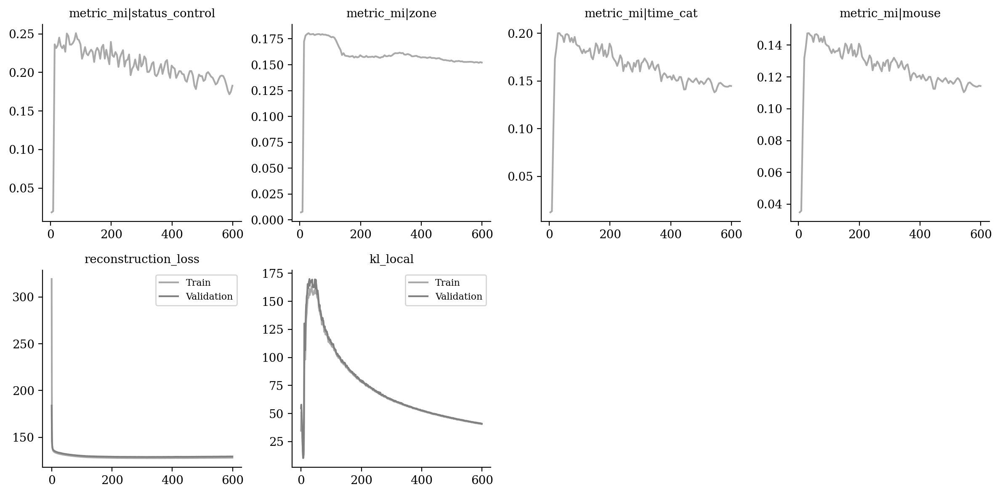

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

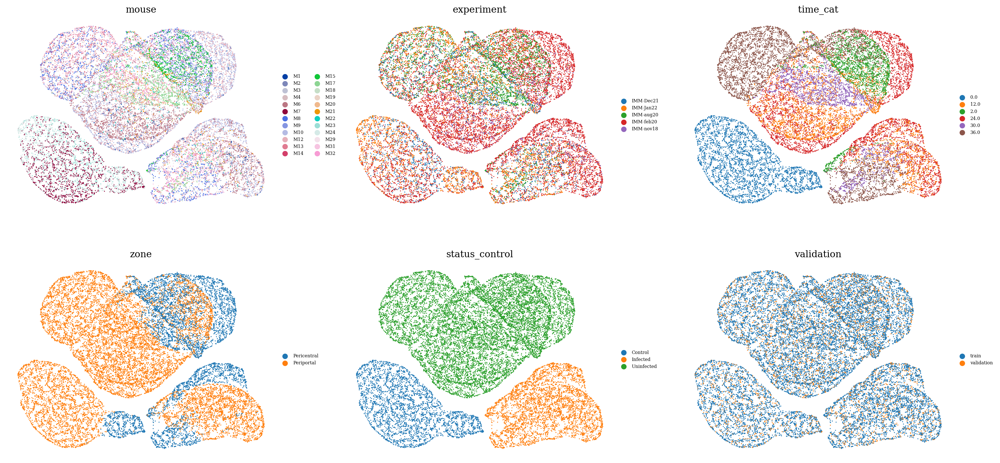

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

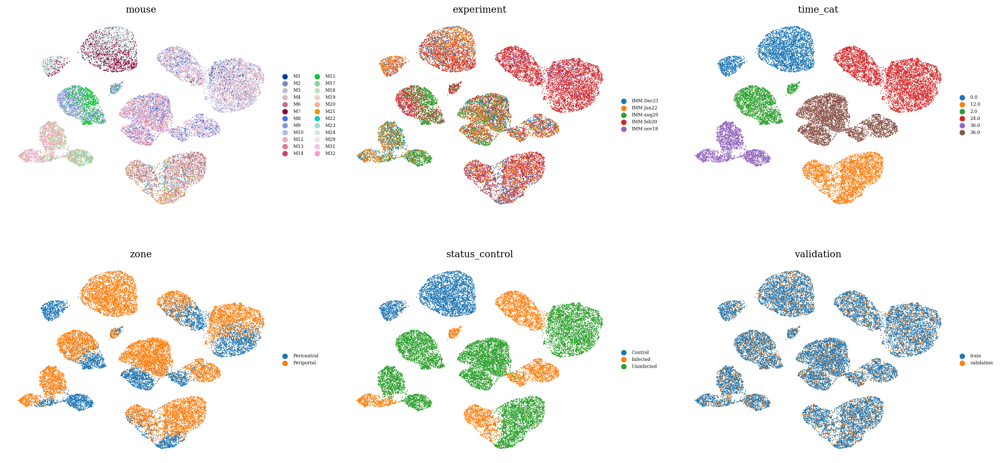

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

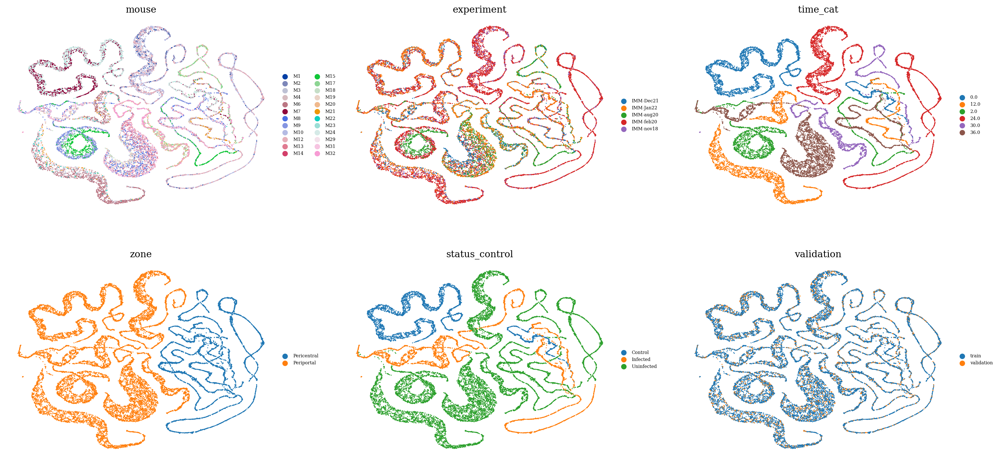

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

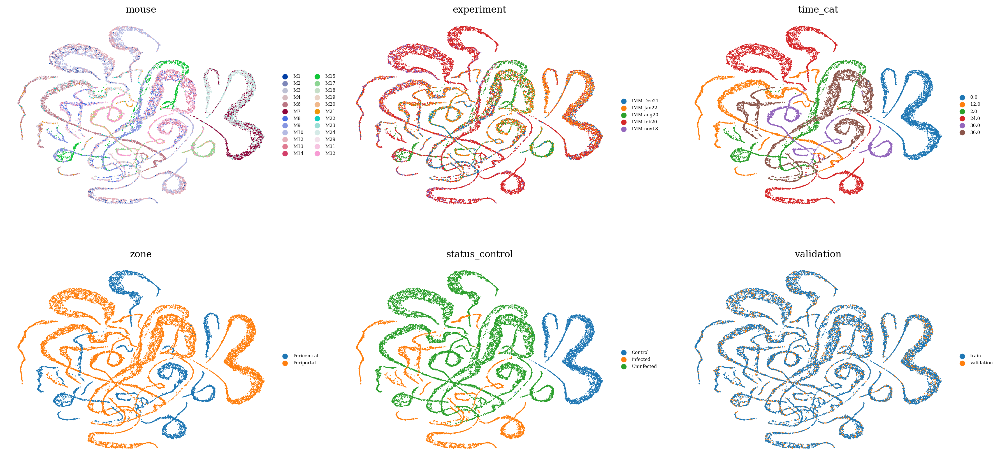

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

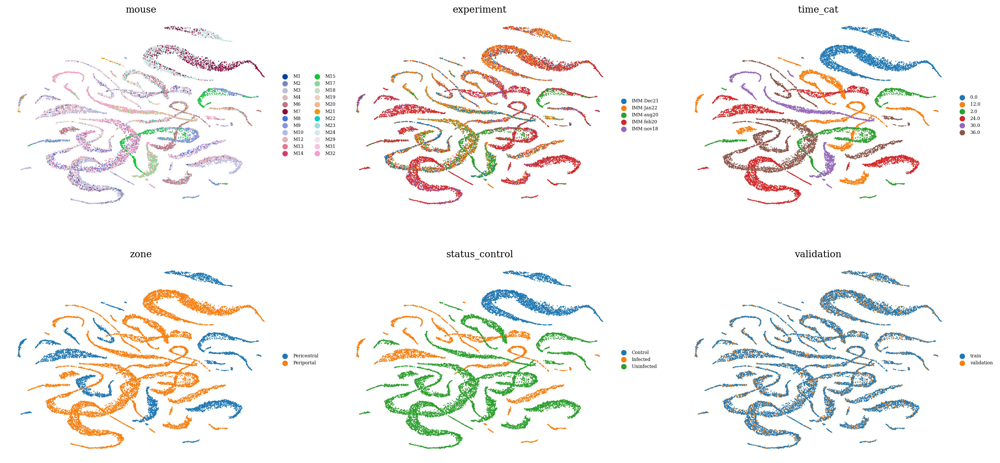

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.7708474052389057

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.7288877446231959

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9984150322600104,
 ('validation', 'unreserved'): 0.20395835993123076,
 ('train', 'reserved'): 0.9964594840569987,
 ('train', 'unreserved'): 0.16164313210102452}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9956468166644137,
 ('validation', 'unreserved'): 0.3937832465309802,
 ('train', 'reserved'): 0.9948676196548126,
 ('train', 'unreserved'): 0.3498122941870344}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.972032238104241,
 ('validation', 'unreserved'): 0.3296524934702919,
 ('train', 'reserved'): 0.9706818940518732,
 ('train', 'unreserved'): 0.26462030274678194}